E:\UNI\D_Drive\PhD\Year_1\2021_02_05_OwnOEDmcPaper\Scripts\PLac

# Import all packages

In [1]:
using DifferentialEquations
using OrdinaryDiffEq
using DiffEqBase
using Sundials
using ODEInterfaceDiffEq
using Plots
using Measures
using CSV
using DataFrames
using Turing
using MCMCChains
using EasyFit
using StatsPlots
using LinearAlgebra
using Random
using Distributions
using OrdinaryDiffEq
Random.seed!(145975);
using CmdStan
using KernelDensity
using LaTeXStrings
using StatsBase
using JLD2
using BlackBoxOptim
using BlackBoxOptim: num_func_evals

set_cmdstan_home!("C:\\cmdstan\\cmdstan-2.30.0");

┌ Warning: Environment variable CMDSTAN_HOME not set. Use set_cmdstan_home!.
└ @ CmdStan C:\Users\dgomez\.julia\packages\CmdStan\2vwWj\src\CmdStan.jl:27


In [2]:
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\FunctionsBayesInfs.jl")
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\ModelFunctionsAll.jl")
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\FunctionsBayesOED.jl")

redSamples (generic function with 2 methods)

# Define True Theta and Bounds

In [3]:
trueP = [48.0, 55.0,0.005911,0.01832,0.042171,0.5365,0.98047,0.991257,0.93335,0.008241,0.9943848,0.001974,   15];

bounds = [[48, 55, 0.001, 0.005, 0.01, 0.1, 0.7, 0.7, 0.7, 0.005, 0.7, 0.0008, 15],
          [48, 55, 0.01, 0.05, 0.08, 0.8, 1.2, 1.2, 1.2, 0.012, 1.2, 0.005, 15]];


InitsY0 = [450, 12599, 226];

boundY0 = [[300, 7000, 100],
           [1000, 25000, 1000]];

# Generate Pseudodata 1

## Generate Repression Curve with Prior Means to Identify Good Sampling Points
Will do this for each posterior to assess better the sampling. At this iteration, we will choose the supposed maximum acording to the total signal on the experiment, which is in the increase curve when only considering maximum peak intensity on the experiment. 
Coincidently, this result gives a really close value to the OED. 

In [4]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));

tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];

samps = convert.(Int, tsC2);

In [5]:
priorTheta = Array{Any}(undef, 13);
priotY0 = Array{Any}(undef, 3);

priotY0[1] = Truncated(Normal(650, 260), 0, 1500);
priotY0[2] = Truncated(Normal(16000, 6400), 0, 4e4);
priotY0[3] = Truncated(Normal(550, 275), 0, 2000);

priorTheta[1] = Normal(40.92, 10); priorTheta[2] = Normal(51.23, 10); priorTheta[3] = Truncated(Normal(0.0055, 0.00275), 0,2); priorTheta[4] = Truncated(Normal(0.0275, 0.01375), 0,2); 
priorTheta[5] = Truncated(Normal(0.045, 0.0225), 0,2); priorTheta[6] = Truncated(Normal(0.45, 0.225), 0,2); priorTheta[7] = Truncated(Normal(0.95, 0.475), 0,2); 
priorTheta[8] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[9] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[10] = Truncated(Normal(0.0085, 0.00425), 0,2);
priorTheta[11] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[12] = Truncated(Normal(0.0029, 0.00145), 0,2); priorTheta[13] = Normal(18.5, 2.29);

In [6]:
sampsTh = zeros(8000, 13);
sampsY0 = zeros(8000, 3);

Random.seed!(657986354); 

for i in 1:13
    sampsTh[:,i] = rand(priorTheta[i], 8000);
end
for i in 1:3
    sampsY0[:,i] = rand(priotY0[i], 8000);
end

In [7]:
sampsTh[:,1] .= trueP[1];
sampsTh[:,2] .= trueP[2];
sampsTh[:,13] .= trueP[13];

In [8]:
Pyrs = collect(0:0.1:40);

Sims = Array{Any}(undef, length(Pyrs));

for i in 1:length(Pyrs)
    ivss = [Pyrs[i].*1000, 0, 0, mean(sampsY0, dims=1)[1], mean(sampsY0, dims=1)[2], mean(sampsY0, dims=1)[3], 0, 0, 0, 0, 0, Pyrs[i].*1000, 0, Pyrs[i].*1000*(trueP[end]*0.12)];
    
    SimulsAll1, SimulsAll2, SimulsAll3  = PyruvateHP_NMR_SolveAllCp(ts, hcat(mean(sampsTh, dims=1), 0), ivss, samps);
    Sims[i] = SimulsAll1;
end


In [9]:
# If we consider for the curve the maximum value on the lactate curve
Lacs = zeros(length(Pyrs));

for i in 1:length(Pyrs)
    Lacs[i] = maximum(Sims[i][:,13,1]);
end


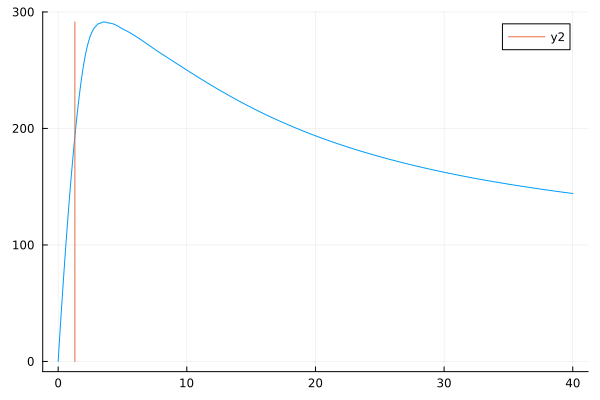

In [10]:
plot(Pyrs, Lacs, label = "")

plot!([1.3, 1.3],[0, maximum(Lacs)])

In [11]:
# If we consider for the curve the sum of all data points of the lactate curve

Lacs = zeros(length(Pyrs));

for i in 1:length(Pyrs)
    Lacs[i] = sum(Sims[i][:,13,1]);
end


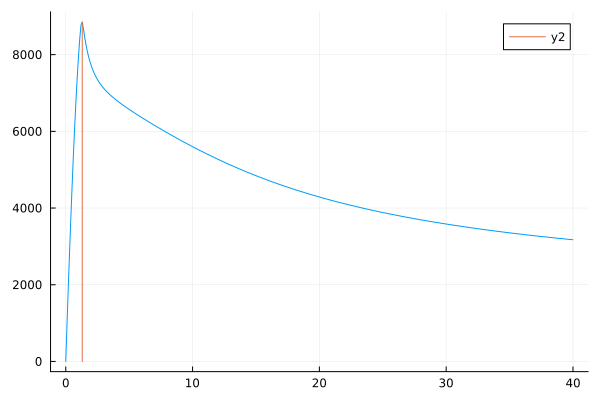

In [12]:
plot(Pyrs, Lacs, label = "")

plot!([1.3, 1.3],[0, maximum(Lacs)])

## Define Experimental Details

In [13]:
Nexp = 1;

PyrCons = [1.3].*1000

1-element Vector{Float64}:
 1300.0

In [14]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));

In [15]:
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];

ivssAll = Array{Any}(undef, Nexp);
for i in 1:Nexp
    ivssAll[i] = [PyrCons[i], 0, 0, InitsY0[1], InitsY0[2], InitsY0[3], 0, 0, 0, 0, 0, PyrCons[i], 0, PyrCons[i]*(trueP[end]*0.12)];;
end
samps = convert.(Int, tsC2);


1.3

## Simulate Experiments and Extract Observables

In [16]:
SimulsAll = Array{Any}(undef, Nexp,3);
for i in 1:Nexp
    SimulsAll[i,1], SimulsAll[i,2], SimulsAll[i,3]  = PyruvateHP_NMR_SolveAllCp(ts, vcat(trueP, 0), ivssAll[i], samps);
end

In [17]:
ObsS = Array{Any}(undef, Nexp,2);
for i in 1:Nexp
    ObsS[i,1] = SimulsAll[i,1][:,14,1]; # Pyruvate HP
    ObsS[i,2] = SimulsAll[i,1][:,13,1]; # Lactate HP
end


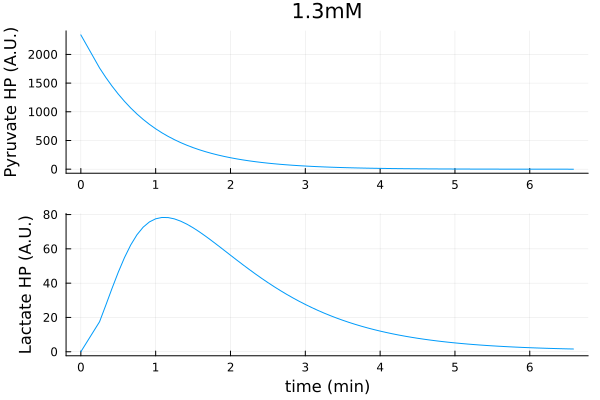

In [18]:
pp1 = plot(samps./60, ObsS[1,1], label = "", title = string(PyrCons[1]/1000)*"mM", ylabel = "Pyruvate HP (A.U.)")
pp2 = plot(samps./60, ObsS[1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")

PP1 = plot(pp1,pp2, layout = (2,1))

# pp1 = plot(samps./60, ObsS[2,1], label = "", title = string(PyrCons[2]/1000)*"mM")
# pp2 = plot(samps./60, ObsS[2,2], label = "", xlabel = "time (min)")

# PP2 = plot(pp1,pp2, layout = (2,1))

# pp1 = plot(samps./60, ObsS[3,1], label = "", title = string(PyrCons[3]/1000)*"mM")
# pp2 = plot(samps./60, ObsS[3,2], label = "", xlabel = "time (min)")

# PP3 = plot(pp1,pp2, layout = (2,1))

# pp1 = plot(samps./60, ObsS[4,1], label = "", title = string(PyrCons[4]/1000)*"mM")
# pp2 = plot(samps./60, ObsS[4,2], label = "", xlabel = "time (min)")

# PP4 = plot(pp1,pp2, layout = (2,1))

# plot(PP1, PP2, PP3, PP4, layout = (1,4), grid = false, size = (1500,600), margin = 8mm)

## Simulate Noise

In [19]:
sigm1=0.12; # 10% additive heteroscedastic noise
sigm2=0.075;


Random.seed!(45659211); 

SolN1NoiseHet = zeros(length(samps),Nexp,2);
basemat = zeros(length(samps),Nexp,2);

i = 1

for i in 1:Nexp
    basemat[:,i,1] = ObsS[i,1]'.*sigm1; # introduce new diagonal matrices
    basemat[:,i,2] = ObsS[i,2]'.*sigm2;

    for zer in collect(1:length(samps)) # To avoid having standard deviations of 0
        if basemat[zer,i,1]<=1
            basemat[zer,i,1] = 1;
        end
        if basemat[zer,i,2]<=1
            basemat[zer,i,2] = 1;
        end
    end

    SolN1NoiseHet[:,i, 1] = ObsS[i,1]#+rand(MvNormal(zeros(length(samps)),basemat[:,i,1]));
    SolN1NoiseHet[:,i, 2] = ObsS[i,2]+rand(MvNormal(zeros(length(samps)),basemat[:,i,2]));
    SolN1NoiseHet[1,i, 2] = 0;
end

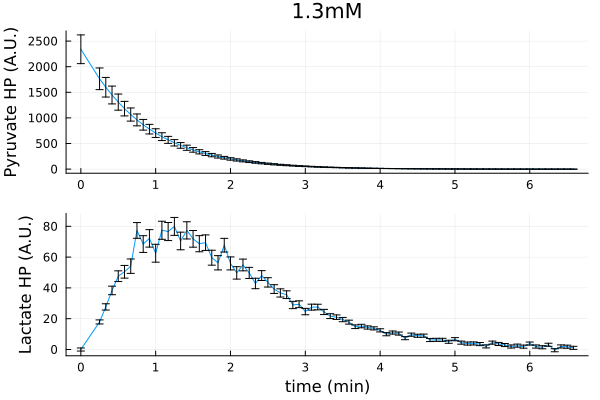

In [20]:
pp1 = plot(samps./60, SolN1NoiseHet[:,1, 1], yerror = basemat[:,1,1], label = "", title = string(PyrCons[1]/1000)*"mM", ylabel = "Pyruvate HP (A.U.)")
pp2 = plot(samps./60, SolN1NoiseHet[:,1, 2], yerror = basemat[:,1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")

PP1 = plot(pp1,pp2, layout = (2,1))

# pp1 = plot(samps./60, SolN1NoiseHet[:,2, 1], yerror = basemat[:,2,1], label = "", title = string(PyrCons[2]/1000)*"mM")
# pp2 = plot(samps./60, SolN1NoiseHet[:,2, 2], yerror = basemat[:,2,2], label = "", xlabel = "time (min)")

# PP2 = plot(pp1,pp2, layout = (2,1))

# pp1 = plot(samps./60, SolN1NoiseHet[:,3, 1], yerror = basemat[:,3,1], label = "", title = string(PyrCons[3]/1000)*"mM")
# pp2 = plot(samps./60, SolN1NoiseHet[:,3, 2], yerror = basemat[:,3,2], label = "", xlabel = "time (min)")

# PP3 = plot(pp1,pp2, layout = (2,1))

# pp1 = plot(samps./60, SolN1NoiseHet[:,4, 1], yerror = basemat[:,4,1], label = "", title = string(PyrCons[4]/1000)*"mM")
# pp2 = plot(samps./60, SolN1NoiseHet[:,4, 2], yerror = basemat[:,4,2], label = "", xlabel = "time (min)")

# PP4 = plot(pp1,pp2, layout = (2,1))

# plot(PP1, PP2, PP3, PP4, layout = (1,4), grid = false, size = (1500,600), margin = 8mm)

## Generate CSV Files For PseudoData

In [32]:
# Observables
for i in 1:Nexp
    Observables = zeros(length(samps),5);
    Observables[:,1] = samps;
    Observables[:,2] = SolN1NoiseHet[:,i, 1];
    Observables[:,3] = basemat[:,i, 1];
    Observables[:,4] = SolN1NoiseHet[:,i, 2];
    Observables[:,5] = basemat[:,i, 2];
    obs_head = ["time","Pyr_MEAN","Pyr_STD","Lac_MEAN","Lac_STD"];

    df1 = DataFrame(Observables, :auto);
    rename!(df1, [obs_head[i] for i in 1:5]);
    CSV.write(string("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\CompRepr_ID",i,"_Observables_Pyr",string(string(PyrCons[i]/1000)),"mM.csv"), df1);
end

## Compute Utility Function of Experiment

In [21]:
NSamps = 1000;

priorTheta = Array{Any}(undef, 13);
priotY0 = Array{Any}(undef, 3);

priorTheta[1] = Normal(40.92, 10); priorTheta[2] = Normal(51.23, 10); priorTheta[3] = Truncated(Normal(0.0055, 0.00275), 0,2); priorTheta[4] = Truncated(Normal(0.0275, 0.01375), 0,2); 
priorTheta[5] = Truncated(Normal(0.045, 0.0225), 0,2); priorTheta[6] = Truncated(Normal(0.45, 0.225), 0,2); priorTheta[7] = Truncated(Normal(0.95, 0.475), 0,2); 
priorTheta[8] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[9] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[10] = Truncated(Normal(0.0085, 0.00425), 0,2);
priorTheta[11] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[12] = Truncated(Normal(0.0029, 0.00145), 0,2); priorTheta[13] = Normal(18.5, 2.29);

priotY0[1] = Truncated(Normal(650, 260), 0, 1600); priotY0[2] = Truncated(Normal(16000, 6400), 0, 4e4); priotY0[3] = Truncated(Normal(550, 275), 0, 1600);
global sampsTh = zeros(NSamps, 13);
global sampsY0 = zeros(NSamps, 3);

Random.seed!(687865443); 

for i in 1:13
    sampsTh[:,i] = rand(priorTheta[i], NSamps);
end
for i in 1:3
    sampsY0[:,i] = rand(priotY0[i], NSamps);
end
sampsTh[:,1] .= 48;
sampsTh[:,2] .= 55;
sampsTh[:,13] .= 15;

global tsC2 = dat32mM[:,1]
global ts = 0:tsC2[end];
global samps = convert.(Int, tsC2);


In [22]:
CompRepUtil_Entro_OEDmc([PyrCons[1]/1000])

402.1998365748715

# Bayesian Inference 1

## Extract Data

In [23]:
mainpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\";
i = 1;
paths = [mainpath*"CompRepr_ID"*string(i)*"_Observables_Pyr"*(string(PyrCons[i]/1000))*"mM.csv"]

1-element Vector{String}:
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 73 bytes ⋯ "pr_ID1_Observables_Pyr1.3mM.csv"

In [24]:
Random.seed!(231549);
global dat = restructDatInfCompRep_FixedSF(paths, rand(Uniform(boundY0[1][1],boundY0[2][1])), rand(Uniform(boundY0[1][2],boundY0[2][2])), rand(Uniform(boundY0[1][3],boundY0[2][3])), 15)

Dict{String, Any} with 14 entries:
  "Means"  => [2340.0; 1763.7; … ; -0.445567; -0.489973;;; 0.0; 17.8806; … ; 1.…
  "stsl"   => [78;;]
  "obSta"  => [1 2]
  "sts"    => [0; 15; … ; 390; 395;;]
  "obser"  => 2
  "Y0us"   => [1300.0; 0.0; … ; 0.0; 2340.0;;]
  "ts"     => [1.0e-20; 1.0; … ; 394.0; 395.0;;]
  "itp"    => [0.0]
  "ncells" => [0;;]
  "stslm"  => 78
  "tml"    => 396
  "Erros"  => [280.8; 211.644; … ; 1.0; 1.0;;; 1.0; 1.31287; … ; 1.0; 1.0]
  "m"      => 1
  "nts"    => [395;;]

## Prior Prediction

In [25]:
priorTheta = Array{Any}(undef, 13);
priotY0 = Array{Any}(undef, 3);

priotY0[1] = Truncated(Normal(650, 260), 0, 1500);
priotY0[2] = Truncated(Normal(16000, 6400), 0, 4e4);
priotY0[3] = Truncated(Normal(550, 275), 0, 2000);

priorTheta[1] = Normal(40.92, 10); priorTheta[2] = Normal(51.23, 10); priorTheta[3] = Truncated(Normal(0.0055, 0.00275), 0,2); priorTheta[4] = Truncated(Normal(0.0275, 0.01375), 0,2); 
priorTheta[5] = Truncated(Normal(0.045, 0.0225), 0,2); priorTheta[6] = Truncated(Normal(0.45, 0.225), 0,2); priorTheta[7] = Truncated(Normal(0.95, 0.475), 0,2); 
priorTheta[8] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[9] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[10] = Truncated(Normal(0.0085, 0.00425), 0,2);
priorTheta[11] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[12] = Truncated(Normal(0.0029, 0.00145), 0,2); priorTheta[13] = Normal(18.5, 2.29);

In [26]:
sampsTh = zeros(8000, 13);
sampsY0 = zeros(8000, 3);

Random.seed!(657986354); 

for i in 1:13
    sampsTh[:,i] = rand(priorTheta[i], 8000);
end
for i in 1:3
    sampsY0[:,i] = rand(priotY0[i], 8000);
end

In [27]:
sampsTh[:,1] .= 48;
sampsTh[:,2] .= 55;
sampsTh[:,13] .= 15;

In [28]:
simsPrior = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,1,1]/(sampsTh[i,end]*0.12), 0, 0, sampsY0[i,1], sampsY0[i,1], sampsY0[i,1], 0, 0, 0, 0, 0, dat["Means"][1,1,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,1,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(sampsTh[i,1:end], 0), ivss, samps);

    simsPrior[i] = SimulsAll;
end

In [29]:
# Dims = Up/Down, Observable, Experiment
PriorQuant = Array{Any}(undef,2,1,1);
lacPirorSims = zeros(size(simsPrior[1])[1], 8000)
[lacPirorSims[:,i] = simsPrior[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PriorQuant[1,k,m] = [percentile(lacPirorSims[j,:], 99.5) for j in 1:size(lacPirorSims)[1]]; # Up
        PriorQuant[2,k,m] = [percentile(lacPirorSims[j,:], 0.5 ) for j in 1:size(lacPirorSims)[1]]; # Down
    end
end


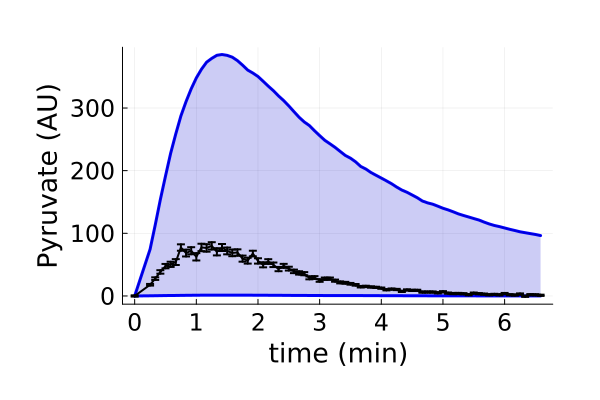

In [30]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"]./60, dat["Means"][:,1,2], yerror = dat["Erros"][:,1,2], linewidth = 2, colour = "black", label = "")

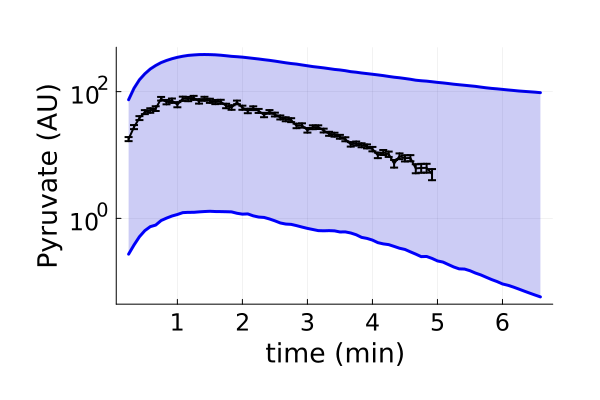

In [29]:
pr = plot(tsC2[2:end]./60, PriorQuant[1][2:end], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2[2:end]./60, PriorQuant[2][2:end], label = "", color = "blue", linewidth = 3)
  plot!(tsC2[2:end]./60, PriorQuant[1][2:end], fillrange=PriorQuant[2][2:end], label="", color="blue3", fillalpha=0.2, yaxis=:log)

  plot!(dat["sts"][2:end-20]./60, dat["Means"][:,1,2][2:end-20], yerror = dat["Erros"][:,1,2][2:end-20], linewidth = 2, colour = "black", label = "", yaxis=:log)

  
display(pr)

## MLE to obtain a good first guess for inference

In [31]:
function ObjectFunctMECp_MLE(p)

    # Define parameter vectors for each amount of cells (last parameter is a time delay, not used in here)
    pD2 = vcat(p[1:end-3], 0);

    # Define time vector
    t2cor = dat["sts"];

    # Define equaly-spaced time vector
    ts1 = collect(0:t2cor[end]);

    # Define initial value for simulation (use of experimental mean)
    ivss1 = [dat["Means"][1,1,1]/(ScFm*0.12), 0, dat["Means"][1,1,2]/(ScFm*0.12), p[end-2], p[end-1], p[end], 0, 0, 0, 0, 0, dat["Means"][1,1,1]/(ScFm*0.12), dat["Means"][1,1,2], dat["Means"][1,1,1]];

    # Convert sampling vector to integer to extract correct elements from simulation
    samps1 = convert.(Int, t2cor);

    # Simulate
    SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllCp(ts1, pD2, ivss1, samps1);
    
    mm22 = sum((-1/2) .* (log(2*pi) .+ log.(dat["Erros"][:,1,2].^2) .+ ((SimOnTime1[:,13] .- dat["Means"][:,1,2]).^2)./(dat["Erros"][:,1,2].^2)));

    # obj = (mm21+mm22)*(mm11+mm12);
    if p[end-2] >= p[end-1]
        mm22 = mm22*10;
    end
    obj = -(mm22);

    
    return(obj)

end


function ObjectFunctMECp_Multi_MLE(p)

    # Define parameter vectors for each amount of cells (last parameter is a time delay, not used in here)
    pD2 = vcat(p[1:end-3], 0);
    obj = 0;
    
    for i in 1:length(dat["stsl"])
        # Define time vector
        t2cor = dat["sts"][:,i];

        # Define equaly-spaced time vector
        ts1 = collect(0:t2cor[end]);

        # Define initial value for simulation (use of experimental mean)
        ivss1 = [dat["Means"][1,i,1]/(ScFm*0.12), 0, dat["Means"][1,i,2]/(ScFm*0.12), p[end-2], p[end-1], p[end], 0, 0, 0, 0, 0, dat["Means"][1,i,1]/(ScFm*0.12), dat["Means"][1,i,2], dat["Means"][1,i,1]];

        # Convert sampling vector to integer to extract correct elements from simulation
        samps1 = convert.(Int, t2cor);

        # Simulate
        SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllCp(ts1, pD2, ivss1, samps1);
    
        mm22 = sum((-1/2) .* (log(2*pi) .+ log.(dat["Erros"][:,i,2].^2) .+ ((SimOnTime1[:,13] .- dat["Means"][:,i,2]).^2)./(dat["Erros"][:,i,2].^2)));

        # obj = (mm21+mm22)*(mm11+mm12);
        if p[end-2] >= p[end-1]
            mm22 = mm22*10;
        end
        obj = -(mm22)+obj;
    end
    
    return(obj)

end


ObjectFunctMECp_Multi_MLE (generic function with 1 method)

In [32]:
global ScFm = 15;
p = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.01, 0.0003, 0.0001, 0.0002, 1e-1, 1e-6, 15, 50/(15*0.12), 5000/(15*0.12), 700/(15*0.12)];
ObjectFunctMECp_Multi_MLE(p)

3088.0657749826833

In [26]:
Iters = 1;
CCsT = Array{Any}(undef,Iters);
FitsT = Array{Any}(undef,Iters);

In [46]:
i=1
fitness_progress_history = Array{Tuple{Int, Float64},1}()
callback = oc -> push!(fitness_progress_history, (num_func_evals(oc), best_fitness(oc)))

resM = bboptimize(ObjectFunctMECp_Multi_MLE; SearchRange = vcat([(bounds[1][i], bounds[2][i]) for i in 1:13], [(boundY0[1][i], boundY0[2][i]) for i in 1:3]), # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
        MaxTime = 60*1, method = :adaptive_de_rand_1_bin, 
        CallbackFunction = callback, CallbackInterval = 0.0)

CCsT[i] = fitness_progress_history;
FitsT[i] = resM;

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
0.50 secs, 92 evals, 54 steps, improv/step: 0.426 (last = 0.4259), fitness=374.008037340
1.07 secs, 198 evals, 125 steps, improv/step: 0.368 (last = 0.3239), fitness=249.894609759
1.57 secs, 307 evals, 218 steps, improv/step: 0.362 (last = 0.3548), fitness=173.706583667
2.07 secs, 418 evals, 319 steps, improv/step: 0.354 (last = 0.3366), fitness=172.205586530
2.58 secs, 510 evals, 408 steps, improv/step: 0.336 (last = 0.2697), fitness=162.231391506
3.08 secs, 638 evals, 536 steps, improv/step: 0.312 (last = 0.2344), fitness=162.231391506
3.58 secs, 732 evals, 631 steps, improv/step: 0.307 (last = 0.2842), fitness=162.231391506
4.09 secs, 828 evals, 727 steps, improv/step: 0.309 (last = 0.3229), fitness=162.231391506
4.59 secs, 938 evals, 843 steps, improv/step: 0.284 (last = 0.1207), f

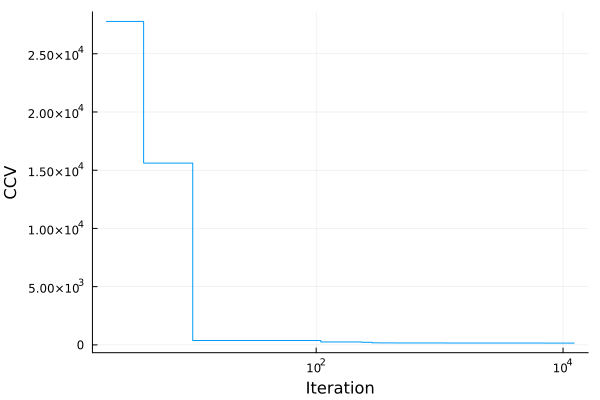

In [47]:
# Plot convergence curve
pl=plot(CCsT[1], xaxis=:log, linetype=:step, label = "", xlabel = "Iteration", ylabel = "CCV")
display(pl)

In [48]:
parfitT = zeros(16, Iters);
for i in 1:Iters
    parfitT[:,i] = best_candidate(FitsT[i]);
end
bestPind = findfirst([CCsT[i][end][2] for i in 1:length(CCsT)] .== minimum([CCsT[i][end][2] for i in 1:length(CCsT)]))
ppT = parfitT[:,bestPind]

16-element Vector{Float64}:
    48.0
    55.0
     0.008720565699099257
     0.017846571002673842
     0.013960325652070449
     0.21519608737135063
     0.862382000847646
     0.771086429762338
     0.911200990552107
     0.008689989023079658
     0.8658302005032269
     0.0015531120235035677
    15.0
   373.41287160546904
 16977.173315407865
   383.75042421342

In [49]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMTRRCmp_ScF_ID1.jld2", "FitsT",FitsT)
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_ID1.jld2", 
        "resMMat",parfitT, "CCsT", CCsT)

In [33]:
ppT = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_ID1.jld2")["resMMat"][:,1]


16-element Vector{Float64}:
    48.0
    55.0
     0.008720565699099257
     0.017846571002673842
     0.013960325652070449
     0.21519608737135063
     0.862382000847646
     0.771086429762338
     0.911200990552107
     0.008689989023079658
     0.8658302005032269
     0.0015531120235035677
    15.0
   373.41287160546904
 16977.173315407865
   383.75042421342

## Compute structure for Stan's initial guess

In [34]:
preTrans = zeros(13);

preTrans[1] = (ppT[3]-0.0055)/0.00275; 
preTrans[2] = (ppT[4]-0.0275)/0.01375;          
preTrans[3] = (ppT[5]-0.045)/0.0225;
preTrans[4] = (ppT[6]-0.45)/0.225;
preTrans[5] = (ppT[7]-0.95)/0.475;
preTrans[6] = (ppT[8]-0.95)/0.475;
preTrans[7] = (ppT[9]-0.95)/0.475;
preTrans[8] = (ppT[10]-0.0085)/0.00425;
preTrans[9] = (ppT[11]-0.95)/0.475;
preTrans[10] = (ppT[12]-0.0029)/0.00145;


preTrans[11] = (ppT[14]-650)/260;
preTrans[12] = (ppT[15]-16000)/6400;
preTrans[13] = (ppT[16]-550)/275;

In [35]:
function genStanInitDict(samps, names, chains)
    alltog = Array{Dict{String,Any},1}(undef,chains);
    for i in 1:(chains)
        global tmp = Dict{String, Any}()
        for j in 1:length(names)
            tmp[names[j]] = samps[j,i];
        end
        alltog[i] = tmp
    end

    return(alltog)
end

samps = hcat(preTrans,preTrans,preTrans,preTrans);
names = ["kin","kpl","kbn","kun","kbp","kup","kunE","kbnE","ki","kr","NADH","NAD","LDH"];

ini = genStanInitDict(samps, names, 4)

4-element Vector{Dict{String, Any}}:
 Dict("kbnE" => 0.044703299548154767, "LDH" => -0.6045439119512, "kin" => 1.1711147996724574, "ki" => -0.1771995778879433, "kunE" => -0.08168212515345882, "kpl" => -0.7020675634419024, "NADH" => -1.063796647671273, "kup" => -0.37666014786876206, "kbp" => -0.18445894558390297, "kr" => -0.9288882596527118…)
 Dict("kbnE" => 0.044703299548154767, "LDH" => -0.6045439119512, "kin" => 1.1711147996724574, "ki" => -0.1771995778879433, "kunE" => -0.08168212515345882, "kpl" => -0.7020675634419024, "NADH" => -1.063796647671273, "kup" => -0.37666014786876206, "kbp" => -0.18445894558390297, "kr" => -0.9288882596527118…)
 Dict("kbnE" => 0.044703299548154767, "LDH" => -0.6045439119512, "kin" => 1.1711147996724574, "ki" => -0.1771995778879433, "kunE" => -0.08168212515345882, "kpl" => -0.7020675634419024, "NADH" => -1.063796647671273, "kup" => -0.37666014786876206, "kbp" => -0.18445894558390297, "kr" => -0.9288882596527118…)
 Dict("kbnE" => 0.044703299548154767, "LDH

## Inference

In [36]:
modelpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\HP_PyrLac_CompetitiveRepressionModel_FixedT1ScF.stan";
stream = open(modelpath,"r");
Model = read(stream,String);
close(stream);

StanModel = Stanmodel(name="PyrCompRepr_ID1_Try1", model=Model, nchains =4,
            num_samples  = 2000, num_warmup = 1000, printsummary=true);
StanModel.method.save_warmup = true;
StanModel.method.adapt.delta = 0.85;
StanModel.method.algorithm.stepsize = 0.1;
StanModel.method.algorithm.engine.max_depth=10;
StanModel.method.algorithm.stepsize_jitter = 0.5;

In [37]:
rc, chns, cnames = stan(StanModel, dat, init = ini) 


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -4: 
Convergence test failures occurred too many times during one internal time step or minimum step size was reached. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessingInference/ComputationalBayesianOED/tmp/PyrCompRepr_ID1_Try1.stan', line 198, column 6 to column 133)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -4: 
Convergence test failures occurred too many times during one internal t

Inference for Stan model: PyrCompRepr_ID1_Try1_model
4 chains: each with iter=(2000,2000,2000,2000); warmup=(1000,1000,1000,1000); thin=(1,1,1,1); 12000 iterations saved.

Warmup took (94072, 90467, 85413, 101140) seconds, 103 hours total
Sampling took (141615, 174601, 189412, 173521) seconds, 189 hours total

                    Mean     MCSE   StdDev        5%       50%       95%    N_Eff  N_Eff/s    R_hat

lp__            -1.6e+02  4.3e-02  2.3e+00  -1.7e+02  -1.6e+02  -1.6e+02  3.0e+03  4.3e-03  1.0e+00
accept_stat__    8.8e-01  1.6e-02  2.1e-01   3.3e-01   9.7e-01      1.00      167  2.5e-04      1.0
stepsize__       7.9e-03  6.2e-04  2.4e-03   4.2e-03   7.8e-03     0.012       16  2.3e-05      1.1
treedepth__      8.6e+00  2.1e-01  1.4e+00   6.0e+00   9.0e+00        10       47  6.9e-05      1.0
n_leapfrog__     5.5e+02  4.5e+01  2.9e+02   1.3e+02   5.1e+02      1023       41  6.0e-05      1.0
divergent__      6.9e-02  4.0e-03  2.5e-01   0.0e+00   0.0e+00       1.0     3943  5.8e

(0, [-159.889 0.906478 … 19360.4 339.343; -159.889 0.0 … 19360.4 339.343; … ; -161.881 0.972239 … 12570.5 235.54; -160.01 0.982909 … 21483.0 192.482;;; -158.525 0.974559 … 17882.4 243.026; -158.525 0.0 … 17882.4 243.026; … ; -160.948 0.998782 … 21275.7 112.211; -158.776 0.742942 … 21304.6 117.698;;; -159.473 0.971854 … 10111.5 511.512; -159.473 0.0 … 10111.5 511.512; … ; -162.186 0.999632 … 25885.1 149.553; -162.903 0.999922 … 13077.0 197.702;;; -158.123 0.989948 … 19812.7 279.898; -158.123 0.0 … 19812.7 279.898; … ; -160.012 0.995577 … 19121.3 110.963; -159.568 0.995477 … 17314.7 334.793], ["lp__", "accept_stat__", "stepsize__", "treedepth__", "n_leapfrog__", "divergent__", "energy__", "kin", "kpl", "kbn"  …  "theta.7", "theta.8", "theta.9", "theta.10", "theta.11", "theta.12", "theta.13", "inits.1", "inits.2", "inits.3"])

In [38]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PyrCompetitiveRepressionInferRes_ID1_Try1.jld", "rc", rc, "chns", chns, "cnames", cnames)

In [39]:
poster = vcat(chns[1001:end, end-15:end, 1], chns[1001:end, end-15:end, 2], chns[1001:end, end-15:end, 3], chns[1001:end, end-15:end, 4])
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_ID1_Try1.jld", "poster", poster)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_ID1_Try1.csv", DataFrame(poster, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_ID1_Try1.csv"

In [36]:
poster = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_ID1_Try1.csv", DataFrame))

8000×16 Matrix{Float64}:
 48.0  55.0  0.00702122  0.0175449  …  15.0  525.193   6693.38  292.101
 48.0  55.0  0.00738367  0.0174377     15.0  152.359  30258.0   530.099
 48.0  55.0  0.00681426  0.0169008     15.0  709.913  22681.9   235.621
 48.0  55.0  0.00745372  0.0164748     15.0  834.551  23086.4   244.751
 48.0  55.0  0.00569324  0.0178098     15.0  410.418  13860.7   211.985
 48.0  55.0  0.00694846  0.0185505  …  15.0  173.243  18854.9   356.6
 48.0  55.0  0.00804032  0.0169724     15.0  606.966  13112.3   343.456
 48.0  55.0  0.00908986  0.0175034     15.0  380.264  15794.2   454.236
 48.0  55.0  0.00648673  0.0170899     15.0  541.379  17897.3   231.738
 48.0  55.0  0.00690246  0.01746       15.0  612.41   18378.2   304.138
  ⋮                                 ⋱                             ⋮
 48.0  55.0  0.00604551  0.0181805     15.0  376.488  23587.7   198.798
 48.0  55.0  0.00803214  0.0185604     15.0  194.143  11312.1   488.895
 48.0  55.0  0.00692427  0.0171413     15.0  

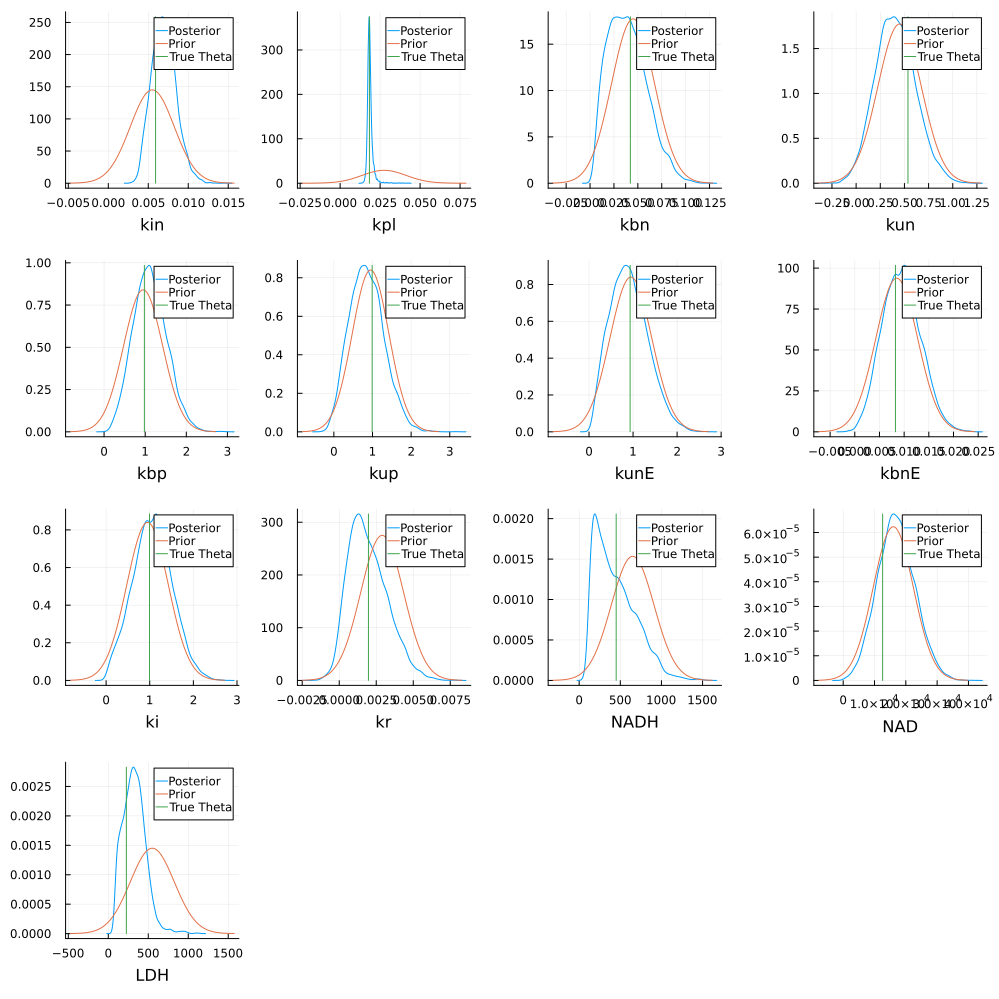

In [41]:
pp1 = plot(kde(poster[:,3]), label = "Posterior", xlabel = names[1])
plot!(Normal(0.0055, 0.00275), label = "Prior")
plot!([trueP[3], trueP[3]],[0, maximum(kde(poster[:,3]).density)], label = "True Theta")

pp2 = plot(kde(poster[:,4]), label = "Posterior", xlabel = names[2])
plot!(Normal(0.0275, 0.01375), label = "Prior")
plot!([trueP[4], trueP[4]],[0, maximum(kde(poster[:,4]).density)], label = "True Theta")

pp3 = plot(kde(poster[:,5]), label = "Posterior", xlabel = names[3])
plot!(Normal(0.045, 0.0225), label = "Prior")
plot!([trueP[5], trueP[5]],[0, maximum(kde(poster[:,5]).density)], label = "True Theta")

pp4 = plot(kde(poster[:,6]), label = "Posterior", xlabel = names[4])
plot!(Normal(0.45, 0.225), label = "Prior")
plot!([trueP[6], trueP[6]],[0, maximum(kde(poster[:,6]).density)], label = "True Theta")

pp5 = plot(kde(poster[:,7]), label = "Posterior", xlabel = names[5])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[7], trueP[7]],[0, maximum(kde(poster[:,7]).density)], label = "True Theta")

pp6 = plot(kde(poster[:,8]), label = "Posterior", xlabel = names[6])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[8], trueP[8]],[0, maximum(kde(poster[:,8]).density)], label = "True Theta")

pp7 = plot(kde(poster[:,9]), label = "Posterior", xlabel = names[7])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[9], trueP[9]],[0, maximum(kde(poster[:,9]).density)], label = "True Theta")

pp8 = plot(kde(poster[:,10]), label = "Posterior", xlabel = names[8])
plot!(Normal(0.0085, 0.00425), label = "Prior")
plot!([trueP[10], trueP[10]],[0, maximum(kde(poster[:,10]).density)], label = "True Theta")

pp9 = plot(kde(poster[:,11]), label = "Posterior", xlabel = names[9])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[11], trueP[11]],[0, maximum(kde(poster[:,11]).density)], label = "True Theta")

pp10 = plot(kde(poster[:,12]), label = "Posterior", xlabel = names[10])
plot!(Normal(0.0029, 0.00145), label = "Prior")
plot!([trueP[12], trueP[12]],[0, maximum(kde(poster[:,12]).density)], label = "True Theta")


pp11 = plot(kde(poster[:,14]), label = "Posterior", xlabel = names[11])
plot!(Normal(650, 260), label = "Prior")
plot!([InitsY0[1], InitsY0[1]],[0, maximum(kde(poster[:,14]).density)], label = "True Theta")

pp12 = plot(kde(poster[:,15]), label = "Posterior", xlabel = names[12])
plot!(Normal(16000, 6400), label = "Prior")
plot!([InitsY0[2], InitsY0[2]],[0, maximum(kde(poster[:,15]).density)], label = "True Theta")

pp13 = plot(kde(poster[:,16]), label = "Posterior", xlabel = names[13])
plot!(Normal(550, 275), label = "Prior")
plot!([InitsY0[3], InitsY0[3]],[0, maximum(kde(poster[:,16]).density)], label = "True Theta")

plot(pp1,pp2,pp3,pp4,pp5,pp6,pp7,pp8,pp9,pp10,pp11,pp12,pp13, size=(1000,1000))

In [42]:
-log(det(cov(hcat(poster[:,3:12], poster[:,14:end]))))

32.34117627038781

## Simulate Experiment Current Posterior

In [37]:
simsPoster = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,1,1]/(sampsTh[i,end]*0.12), 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, dat["Means"][1,1,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,1,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(poster[i,1:13], 0), ivss, samps);

    simsPoster[i] = SimulsAll;
end

In [38]:
# Dims = Up/Down, Observable, Experiment
PostQuant = Array{Any}(undef,2,1,1);
lacPostSims = zeros(size(simsPoster[1])[1], 8000)
[lacPostSims[:,i] = simsPoster[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PostQuant[1,k,m] = [percentile(lacPostSims[j,:], 99.5) for j in 1:size(lacPostSims)[1]]; # Up
        PostQuant[2,k,m] = [percentile(lacPostSims[j,:], 0.5 ) for j in 1:size(lacPostSims)[1]]; # Down
    end
end


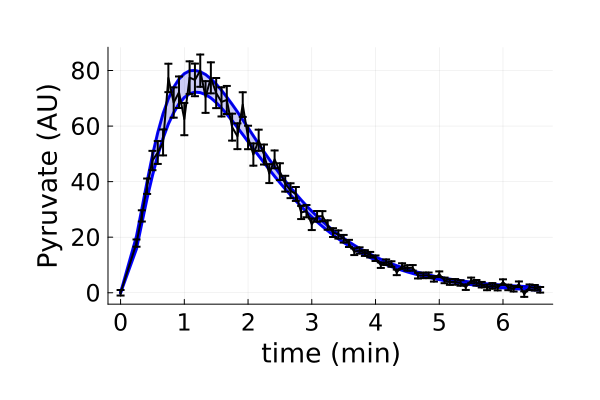

In [39]:
pr = plot(tsC2./60, PostQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PostQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PostQuant[1], fillrange=PostQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"]./60, dat["Means"][:,1,2], yerror = dat["Erros"][:,1,2], linewidth = 2, colour = "black", label = "")

# Generate Pseudodata 2

## Generate Repression Curve with Prior Means to Identify Good Sampling Points
Will do this for each posterior to assess better the sampling. At this iteration, we will choose a point in the curve down on repression, halfway ish between maximum and minimum on the high concentration range. 

In [40]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));

tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];

samps = convert.(Int, tsC2);

In [41]:
sampsTh = abs.(poster[:,1:13]);
sampsY0 = abs.(poster[:,14:end]);

In [42]:
Pyrs = collect(0:0.1:40);

Sims = Array{Any}(undef, length(Pyrs));

for i in 1:length(Pyrs)
    ivss = [Pyrs[i].*1000, 0, 0, mean(sampsY0, dims=1)[1], mean(sampsY0, dims=1)[2], mean(sampsY0, dims=1)[3], 0, 0, 0, 0, 0, Pyrs[i].*1000, 0, Pyrs[i].*1000*(trueP[end]*0.12)];
    
    SimulsAll1, SimulsAll2, SimulsAll3  = PyruvateHP_NMR_SolveAllCp(ts, hcat(mean(sampsTh, dims=1), 0), ivss, samps);
    Sims[i] = SimulsAll1;
end


In [43]:
# If we consider for the curve the maximum value on the lactate curve
Lacs = zeros(length(Pyrs));

for i in 1:length(Pyrs)
    Lacs[i] = maximum(Sims[i][:,13,1]);
end


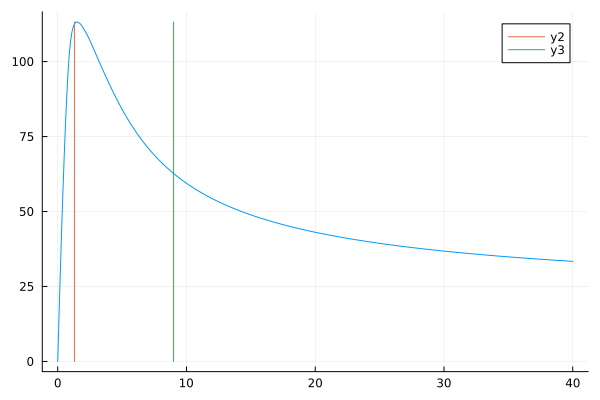

In [44]:
plot(Pyrs, Lacs, label = "")

plot!([1.3, 1.3],[0, maximum(Lacs)])

plot!([9, 9],[0, maximum(Lacs)])

In [45]:
# If we consider for the curve the sum of all data points of the lactate curve

Lacs = zeros(length(Pyrs));

for i in 1:length(Pyrs)
    Lacs[i] = sum(Sims[i][:,13,1]);
end


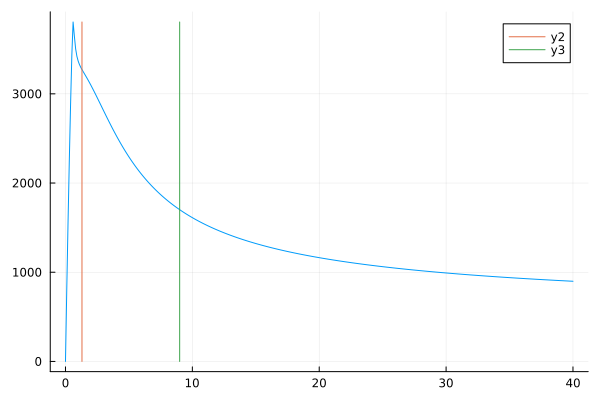

In [46]:
plot(Pyrs, Lacs, label = "")

plot!([1.3, 1.3],[0, maximum(Lacs)])
plot!([9, 9],[0, maximum(Lacs)])

## Define Experimental Details

In [47]:
Nexp = 2;

PyrCons = [1.3, 9].*1000

2-element Vector{Float64}:
 1300.0
 9000.0

## Compute Utility Function of Experiment

In [48]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));
global tsC2 = dat32mM[:,1]
global ts = 0:tsC2[end];
global samps = convert.(Int, tsC2);
global sampsTh = abs.(poster[:,1:13]);
global sampsY0 = abs.(poster[:,14:end]);

In [49]:
CompRepUtil_Entro_OEDmc(PyrCons[2]/1000)

191.42070424684104

In [50]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));

In [51]:
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];

ivssAll = Array{Any}(undef, Nexp);
for i in 1:Nexp
    ivssAll[i] = [PyrCons[i], 0, 0, InitsY0[1], InitsY0[2], InitsY0[3], 0, 0, 0, 0, 0, PyrCons[i], 0, PyrCons[i]*(trueP[end]*0.12)];;
end
samps = convert.(Int, tsC2);


## Simulate Experiments and Extract Observables

In [52]:
SimulsAll = Array{Any}(undef, Nexp,3);
for i in 1:Nexp
    SimulsAll[i,1], SimulsAll[i,2], SimulsAll[i,3]  = PyruvateHP_NMR_SolveAllCp(ts, vcat(trueP, 0), ivssAll[i], samps);
end

In [53]:
ObsS = Array{Any}(undef, Nexp,2);
for i in 1:Nexp
    ObsS[i,1] = SimulsAll[i,1][:,14,1]; # Pyruvate HP
    ObsS[i,2] = SimulsAll[i,1][:,13,1]; # Lactate HP
end


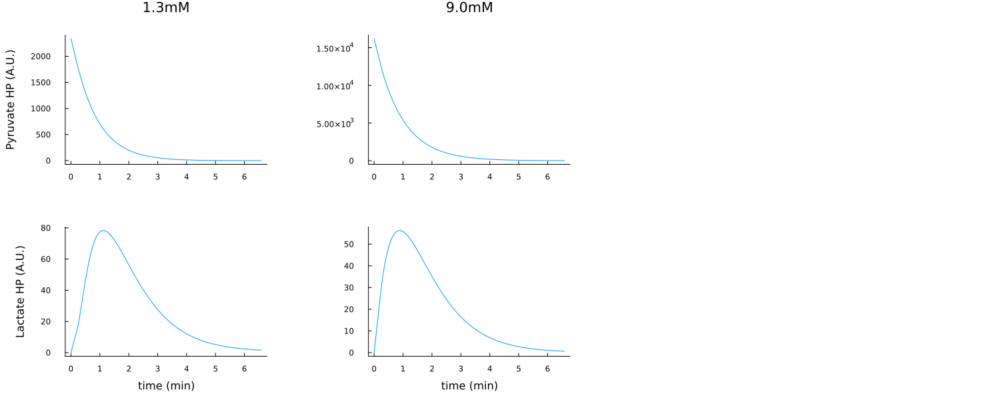

In [54]:
pp1 = plot(samps./60, ObsS[1,1], label = "", title = string(PyrCons[1]/1000)*"mM", ylabel = "Pyruvate HP (A.U.)")
pp2 = plot(samps./60, ObsS[1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")

PP1 = plot(pp1,pp2, layout = (2,1))

pp1 = plot(samps./60, ObsS[2,1], label = "", title = string(PyrCons[2]/1000)*"mM")
pp2 = plot(samps./60, ObsS[2,2], label = "", xlabel = "time (min)")

PP2 = plot(pp1,pp2, layout = (2,1))

# pp1 = plot(samps./60, ObsS[3,1], label = "", title = string(PyrCons[3]/1000)*"mM")
# pp2 = plot(samps./60, ObsS[3,2], label = "", xlabel = "time (min)")

# PP3 = plot(pp1,pp2, layout = (2,1))

# pp1 = plot(samps./60, ObsS[4,1], label = "", title = string(PyrCons[4]/1000)*"mM")
# pp2 = plot(samps./60, ObsS[4,2], label = "", xlabel = "time (min)")

# PP4 = plot(pp1,pp2, layout = (2,1))

plot(PP1, PP2, layout = (1,4), grid = false, size = (1500,600), margin = 8mm)

## Simulate Noise

In [55]:
sigm1=0.12; # 10% additive heteroscedastic noise
sigm2=0.075;


Random.seed!(45659211); 

SolN1NoiseHet = zeros(length(samps),Nexp,2);
basemat = zeros(length(samps),Nexp,2);

i = 1

for i in 1:Nexp
    basemat[:,i,1] = ObsS[i,1]'.*sigm1; # introduce new diagonal matrices
    basemat[:,i,2] = ObsS[i,2]'.*sigm2;

    for zer in collect(1:length(samps)) # To avoid having standard deviations of 0
        if basemat[zer,i,1]<=1
            basemat[zer,i,1] = 1;
        end
        if basemat[zer,i,2]<=1
            basemat[zer,i,2] = 1;
        end
    end

    SolN1NoiseHet[:,i, 1] = ObsS[i,1]#+rand(MvNormal(zeros(length(samps)),basemat[:,i,1]));
    SolN1NoiseHet[:,i, 2] = ObsS[i,2]+rand(MvNormal(zeros(length(samps)),basemat[:,i,2]));
    SolN1NoiseHet[1,i, 2] = 0;
end

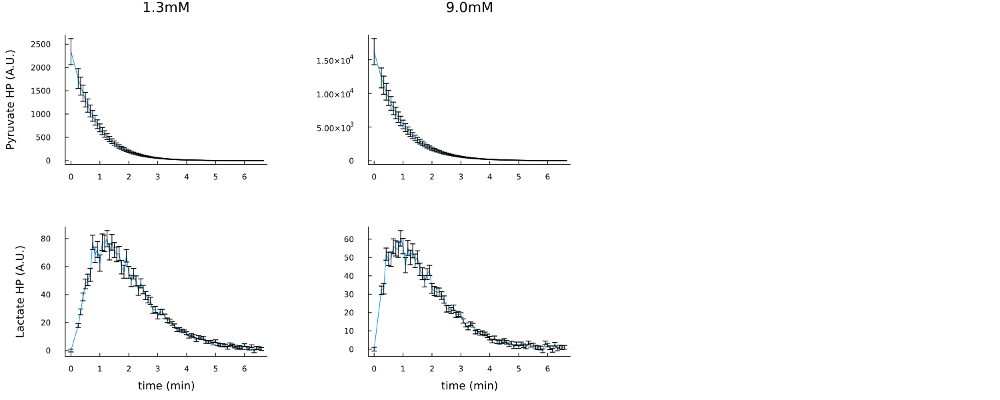

In [56]:
pp1 = plot(samps./60, SolN1NoiseHet[:,1, 1], yerror = basemat[:,1,1], label = "", title = string(PyrCons[1]/1000)*"mM", ylabel = "Pyruvate HP (A.U.)")
pp2 = plot(samps./60, SolN1NoiseHet[:,1, 2], yerror = basemat[:,1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")

PP1 = plot(pp1,pp2, layout = (2,1))

pp1 = plot(samps./60, SolN1NoiseHet[:,2, 1], yerror = basemat[:,2,1], label = "", title = string(PyrCons[2]/1000)*"mM")
pp2 = plot(samps./60, SolN1NoiseHet[:,2, 2], yerror = basemat[:,2,2], label = "", xlabel = "time (min)")

PP2 = plot(pp1,pp2, layout = (2,1))

# pp1 = plot(samps./60, SolN1NoiseHet[:,3, 1], yerror = basemat[:,3,1], label = "", title = string(PyrCons[3]/1000)*"mM")
# pp2 = plot(samps./60, SolN1NoiseHet[:,3, 2], yerror = basemat[:,3,2], label = "", xlabel = "time (min)")

# PP3 = plot(pp1,pp2, layout = (2,1))

# pp1 = plot(samps./60, SolN1NoiseHet[:,4, 1], yerror = basemat[:,4,1], label = "", title = string(PyrCons[4]/1000)*"mM")
# pp2 = plot(samps./60, SolN1NoiseHet[:,4, 2], yerror = basemat[:,4,2], label = "", xlabel = "time (min)")

# PP4 = plot(pp1,pp2, layout = (2,1))

plot(PP1, PP2, layout = (1,4), grid = false, size = (1500,600), margin = 8mm)

## Generate CSV Files For PseudoData

In [71]:
# Observables
for i in 2:Nexp
    Observables = zeros(length(samps),5);
    Observables[:,1] = samps;
    Observables[:,2] = SolN1NoiseHet[:,i, 1];
    Observables[:,3] = basemat[:,i, 1];
    Observables[:,4] = SolN1NoiseHet[:,i, 2];
    Observables[:,5] = basemat[:,i, 2];
    obs_head = ["time","Pyr_MEAN","Pyr_STD","Lac_MEAN","Lac_STD"];

    df1 = DataFrame(Observables, :auto);
    rename!(df1, [obs_head[i] for i in 1:5]);
    CSV.write(string("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\CompRepr_ID",i,"_Observables_Pyr",string(string(PyrCons[i]/1000)),"mM.csv"), df1);
end

# Bayesian Inference 2

## Extract Data

In [57]:
mainpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\";
i = 2;
paths = [mainpath*"CompRepr_ID"*string(1)*"_Observables_Pyr"*(string(PyrCons[1]/1000))*"mM.csv",
         mainpath*"CompRepr_ID"*string(2)*"_Observables_Pyr"*(string(PyrCons[2]/1000))*"mM.csv"]

2-element Vector{String}:
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 73 bytes ⋯ "pr_ID1_Observables_Pyr1.3mM.csv"
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 73 bytes ⋯ "pr_ID2_Observables_Pyr9.0mM.csv"

In [58]:
Random.seed!(2133567);
global dat = restructDatInfCompRep_FixedSF(paths, rand(Uniform(boundY0[1][1],boundY0[2][1])), rand(Uniform(boundY0[1][2],boundY0[2][2])), rand(Uniform(boundY0[1][3],boundY0[2][3])), 15)

Dict{String, Any} with 14 entries:
  "Means"  => [2340.0 16200.0; 1763.7 12302.0; … ; -0.445567 12.4253; -0.489973…
  "stsl"   => [78 78]
  "obSta"  => [1 2]
  "sts"    => [0 0; 15 15; … ; 390 390; 395 395]
  "obser"  => 2
  "Y0us"   => [1300.0 9000.0; 0.0 0.0; … ; 0.0 0.0; 2340.0 16200.0]
  "ts"     => [1.0e-20 1.0e-20; 1.0 1.0; … ; 394.0 394.0; 395.0 395.0]
  "itp"    => [0.0, 0.0]
  "ncells" => [0 0]
  "stslm"  => 78
  "tml"    => 396
  "Erros"  => [280.8 1944.0; 211.644 1476.24; … ; 1.0 1.49104; 1.0 1.35921;;; 1…
  "m"      => 2
  "nts"    => [395 395]

## Prior Prediction

In [59]:
simsPrior = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"][:,end];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,end,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(poster[i,1:13], 0), ivss, samps);

    simsPrior[i] = SimulsAll;
end

In [60]:
# Dims = Up/Down, Observable, Experiment
PriorQuant = Array{Any}(undef,2,1,1);
lacPirorSims = zeros(size(simsPrior[1])[1], 8000)
[lacPirorSims[:,i] = simsPrior[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PriorQuant[1,k,m] = [percentile(lacPirorSims[j,:], 99.5) for j in 1:size(lacPirorSims)[1]]; # Up
        PriorQuant[2,k,m] = [percentile(lacPirorSims[j,:], 0.5 ) for j in 1:size(lacPirorSims)[1]]; # Down
    end
end


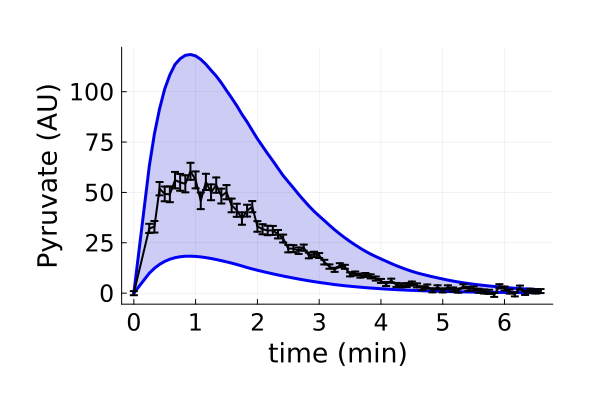

In [61]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"][:,end]./60, dat["Means"][:,end,2], yerror = dat["Erros"][:,end,2], linewidth = 2, colour = "black", label = "")

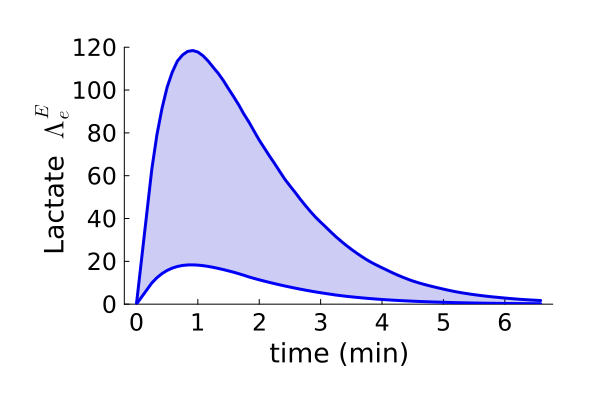

In [64]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Lactate  "*L"\Lambda^E_e", grid = false, ylim = (0,120))
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

savefig("IDPredIter2.svg")

pr

## MLE to obtain a good first guess for inference

In [34]:
global ScFm = 15;
p = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.01, 0.0003, 0.0001, 0.0002, 1e-1, 1e-6, 15, 50/(15*0.12), 5000/(15*0.12), 700/(15*0.12)];
ObjectFunctMECp_Multi_MLE(p)

5196.317360146577

In [35]:
Iters = 1;
CCsT = Array{Any}(undef,Iters);
FitsT = Array{Any}(undef,Iters);

In [62]:
i=1
fitness_progress_history = Array{Tuple{Int, Float64},1}()
callback = oc -> push!(fitness_progress_history, (num_func_evals(oc), best_fitness(oc)))

resM = bboptimize(ObjectFunctMECp_Multi_MLE; SearchRange = vcat([(minimum(abs.(poster[:,i])), maximum(abs.(poster[:,i]))) for i in 1:13], 
                                                                [(minimum(abs.(poster[:,i])), maximum(abs.(poster[:,i]))) for i in 14:16]), # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
        MaxTime = 60*2, method = :adaptive_de_rand_1_bin, 
        CallbackFunction = callback, CallbackInterval = 0.0)

CCsT[i] = fitness_progress_history;
FitsT[i] = resM;

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
0.62 secs, 35 evals, 19 steps, improv/step: 0.368 (last = 0.3684), fitness=809.333311845
1.18 secs, 70 evals, 39 steps, improv/step: 0.436 (last = 0.5000), fitness=531.143014502
1.68 secs, 118 evals, 67 steps, improv/step: 0.418 (last = 0.3929), fitness=531.143014502
2.19 secs, 165 evals, 99 steps, improv/step: 0.404 (last = 0.3750), fitness=531.143014502
2.77 secs, 213 evals, 137 steps, improv/step: 0.409 (last = 0.4211), fitness=531.143014502
3.27 secs, 255 evals, 173 steps, improv/step: 0.387 (last = 0.3056), fitness=531.143014502
3.78 secs, 296 evals, 210 steps, improv/step: 0.381 (last = 0.3514), fitness=531.143014502
4.28 secs, 340 evals, 253 steps, improv/step: 0.364 (last = 0.2791), fitness=531.143014502
4.85 secs, 389 evals, 294 steps, improv/step: 0.347 (last = 0.2439), fitne

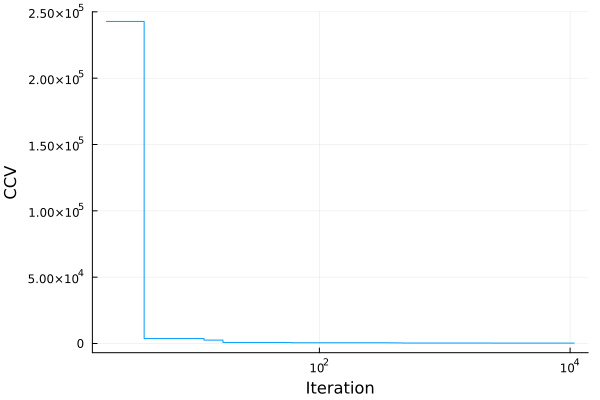

In [63]:
# Plot convergence curve
pl=plot(CCsT[1], xaxis=:log, linetype=:step, label = "", xlabel = "Iteration", ylabel = "CCV")
display(pl)

In [64]:
parfitT = zeros(16, Iters);
for i in 1:Iters
    parfitT[:,i] = best_candidate(FitsT[i]);
end
bestPind = findfirst([CCsT[i][end][2] for i in 1:length(CCsT)] .== minimum([CCsT[i][end][2] for i in 1:length(CCsT)]))
ppT = parfitT[:,bestPind]

16-element Vector{Float64}:
   48.0
   55.0
    0.004905716063693781
    0.018677815075386687
    0.058372463294058693
    0.4545575296540828
    1.1382023794156144
    1.159125204707124
    0.9608884222524313
    0.00980421198322699
    1.0254603712412982
    0.0008956248423227754
   15.0
  700.1129469191648
 8970.625254948725
  129.46690429207763

In [65]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMTRRCmp_ScF_ID2.jld2", "FitsT",FitsT)
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_ID2.jld2", 
        "resMMat",parfitT, "CCsT", CCsT)

In [65]:
ppT = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_ID2.jld2")["resMMat"][:,1]


16-element Vector{Float64}:
   48.0
   55.0
    0.004905716063693781
    0.018677815075386687
    0.058372463294058693
    0.4545575296540828
    1.1382023794156144
    1.159125204707124
    0.9608884222524313
    0.00980421198322699
    1.0254603712412982
    0.0008956248423227754
   15.0
  700.1129469191648
 8970.625254948725
  129.46690429207763

## Compute structure for Stan's initial guess

In [37]:
preTrans = zeros(13);

preTrans[1] = (ppT[3]-0.0055)/0.00275; 
preTrans[2] = (ppT[4]-0.0275)/0.01375;          
preTrans[3] = (ppT[5]-0.045)/0.0225;
preTrans[4] = (ppT[6]-0.45)/0.225;
preTrans[5] = (ppT[7]-0.95)/0.475;
preTrans[6] = (ppT[8]-0.95)/0.475;
preTrans[7] = (ppT[9]-0.95)/0.475;
preTrans[8] = (ppT[10]-0.0085)/0.00425;
preTrans[9] = (ppT[11]-0.95)/0.475;
preTrans[10] = (ppT[12]-0.0029)/0.00145;


preTrans[11] = (ppT[14]-650)/260;
preTrans[12] = (ppT[15]-16000)/6400;
preTrans[13] = (ppT[16]-550)/275;

In [38]:
function genStanInitDict(samps, names, chains)
    alltog = Array{Dict{String,Any},1}(undef,chains);
    for i in 1:(chains)
        global tmp = Dict{String, Any}()
        for j in 1:length(names)
            tmp[names[j]] = samps[j,i];
        end
        alltog[i] = tmp
    end

    return(alltog)
end

samps = hcat(preTrans,preTrans,preTrans,preTrans);
names = ["kin","kpl","kbn","kun","kbp","kup","kunE","kbnE","ki","kr","NADH","NAD","LDH"];

ini = genStanInitDict(samps, names, 4)

4-element Vector{Dict{String, Any}}:
 Dict("kbnE" => 0.306873407818115, "LDH" => -1.5292112571197176, "kin" => -0.21610324956589763, "ki" => 0.1588639394553647, "kunE" => 0.022922994215644973, "kpl" => -0.6416134490627864, "NADH" => 0.19274210353524907, "kup" => 0.4402635888571035, "kbp" => 0.39621553561181994, "kr" => -1.3823276949498102…)
 Dict("kbnE" => 0.306873407818115, "LDH" => -1.5292112571197176, "kin" => -0.21610324956589763, "ki" => 0.1588639394553647, "kunE" => 0.022922994215644973, "kpl" => -0.6416134490627864, "NADH" => 0.19274210353524907, "kup" => 0.4402635888571035, "kbp" => 0.39621553561181994, "kr" => -1.3823276949498102…)
 Dict("kbnE" => 0.306873407818115, "LDH" => -1.5292112571197176, "kin" => -0.21610324956589763, "ki" => 0.1588639394553647, "kunE" => 0.022922994215644973, "kpl" => -0.6416134490627864, "NADH" => 0.19274210353524907, "kup" => 0.4402635888571035, "kbp" => 0.39621553561181994, "kr" => -1.3823276949498102…)
 Dict("kbnE" => 0.306873407818115, "LDH" => -

## Inference

In [70]:
modelpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\HP_PyrLac_CompetitiveRepressionModel_FixedT1ScF.stan";
stream = open(modelpath,"r");
Model = read(stream,String);
close(stream);

StanModel = Stanmodel(name="PyrCompRepr_ID2_Try1", model=Model, nchains =4,
            num_samples  = 2000, num_warmup = 1000, printsummary=true);
StanModel.method.save_warmup = true;
StanModel.method.adapt.delta = 0.85;
StanModel.method.algorithm.stepsize = 0.1;
StanModel.method.algorithm.engine.max_depth=10;
StanModel.method.algorithm.stepsize_jitter = 0.5;

In [71]:
rc, chns, cnames = stan(StanModel, dat, init = ini) 


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -1: 
The solver took mxstep internal steps but could not reach tout. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessingInference/ComputationalBayesianOED/tmp/PyrCompRepr_ID2_Try1.stan', line 198, column 6 to column 133)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -1: 
The solver took mxstep internal steps but could not reach tout. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessing

Inference for Stan model: PyrCompRepr_ID2_Try1_model
4 chains: each with iter=(2000,2000,2000,2000); warmup=(1000,1000,1000,1000); thin=(1,1,1,1); 12000 iterations saved.

Warmup took (201794, 219702, 220087, 195300) seconds, 232 hours total
Sampling took (455984, 467354, 429909, 519062) seconds, 520 hours total

                    Mean     MCSE   StdDev        5%       50%       95%    N_Eff  N_Eff/s    R_hat

lp__            -3.1e+02  4.4e-02  2.5e+00  -3.2e+02  -3.1e+02  -3.1e+02  3.1e+03  1.7e-03  1.0e+00
accept_stat__    9.5e-01  2.1e-03  1.1e-01   7.9e-01   9.9e-01   1.0e+00     2475  1.3e-03      1.0
stepsize__       4.7e-03  6.6e-04  1.6e-03   2.3e-03   4.5e-03   7.5e-03      6.0  3.2e-06      1.2
treedepth__      9.5e+00  1.5e-01  7.8e-01   9.0e+00   1.0e+01   1.0e+01       27  1.4e-05      1.0
n_leapfrog__     8.4e+02  6.1e+01  2.6e+02   5.1e+02   1.0e+03   1.0e+03       18  9.8e-06      1.1
divergent__      1.0e-02  1.4e-03  1.0e-01   0.0e+00   0.0e+00   0.0e+00     5473  2

(0, [-311.095 0.962998 … 9703.03 183.326; -311.095 0.0 … 9703.03 183.326; … ; -310.171 0.98038 … 19164.2 328.497; -313.573 0.889518 … 8340.22 402.756;;; -313.209 0.933285 … 12358.2 134.901; -313.209 0.0 … 12358.2 134.901; … ; -310.37 0.999378 … 18864.4 365.25; -310.351 0.99888 … 15357.0 455.425;;; -310.141 0.997647 … 10698.1 104.436; -310.141 0.0 … 10698.1 104.436; … ; -311.292 0.990656 … 22191.8 565.302; -310.758 0.952613 … 20135.4 454.335;;; -310.973 0.996053 … 9258.45 95.7497; -310.973 0.0 … 9258.45 95.7497; … ; -311.032 0.959896 … 10781.0 362.571; -309.096 0.991658 … 12197.8 365.253], ["lp__", "accept_stat__", "stepsize__", "treedepth__", "n_leapfrog__", "divergent__", "energy__", "kin", "kpl", "kbn"  …  "theta.7", "theta.8", "theta.9", "theta.10", "theta.11", "theta.12", "theta.13", "inits.1", "inits.2", "inits.3"])

In [72]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PyrCompetitiveRepressionInferRes_ID2_Try1.jld", "rc", rc, "chns", chns, "cnames", cnames)

In [73]:
poster = vcat(chns[1001:end, end-15:end, 1], chns[1001:end, end-15:end, 2], chns[1001:end, end-15:end, 3], chns[1001:end, end-15:end, 4])
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_ID2_Try1.jld", "poster", poster)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_ID2_Try1.csv", DataFrame(poster, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_ID2_Try1.csv"

In [66]:
poster = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_ID2_Try1.csv", DataFrame))

8000×16 Matrix{Float64}:
 48.0  55.0  0.00587597  0.0191895  …  15.0  151.313  12044.2   437.299
 48.0  55.0  0.00756083  0.0183863     15.0  232.08   15324.1   364.712
 48.0  55.0  0.00740062  0.0185873     15.0  278.178  15404.2   448.461
 48.0  55.0  0.00773539  0.0185898     15.0  236.809  22472.8   442.577
 48.0  55.0  0.00769314  0.0186694     15.0  176.433  17555.6   467.937
 48.0  55.0  0.00640219  0.0189925  …  15.0  279.074  18765.5   323.581
 48.0  55.0  0.00752466  0.0186377     15.0  179.464  11280.6   459.074
 48.0  55.0  0.00611272  0.018055      15.0  413.559  17609.0   246.108
 48.0  55.0  0.00726078  0.0183509     15.0  636.952  17403.8   318.885
 48.0  55.0  0.00901308  0.0183242     15.0  531.118  16197.8   408.951
  ⋮                                 ⋱                             ⋮
 48.0  55.0  0.00601312  0.0181163     15.0  133.605  18296.8   389.488
 48.0  55.0  0.00779679  0.0186061     15.0  231.593  11124.9   406.3
 48.0  55.0  0.00535494  0.0187817     15.0  

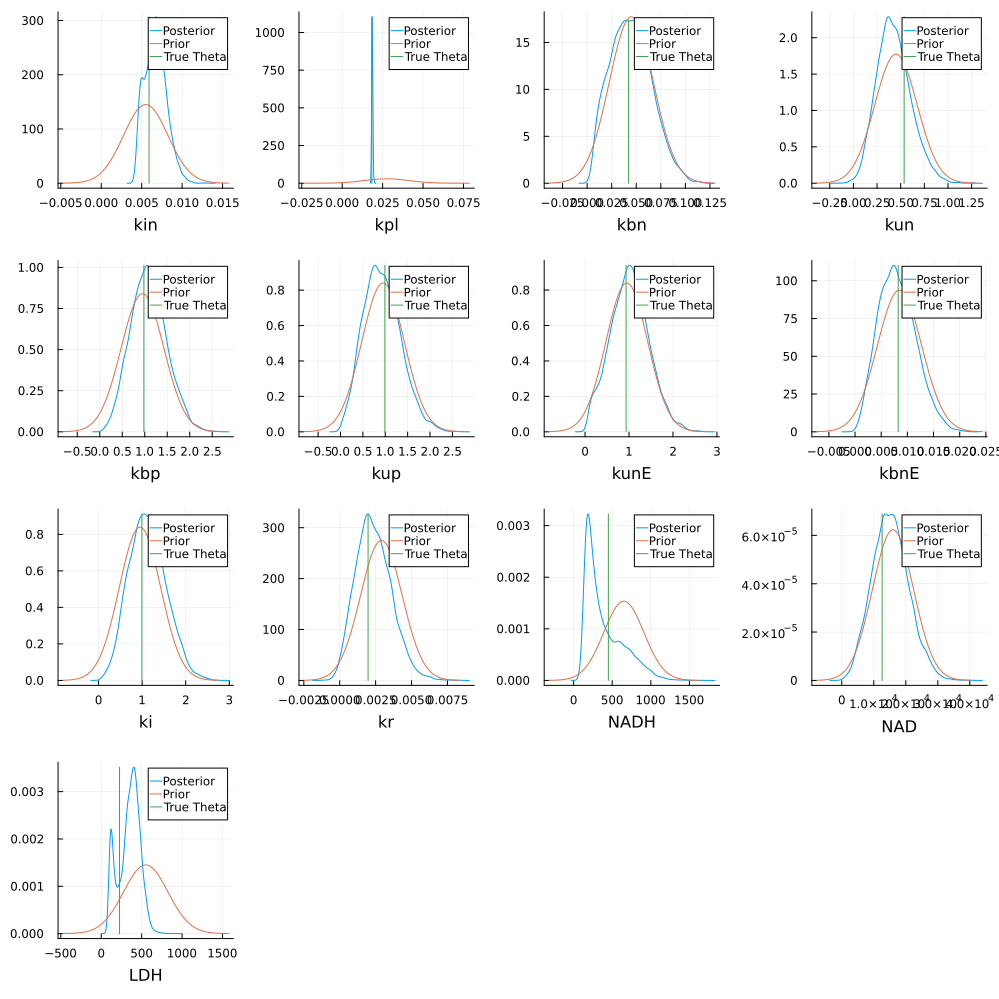

In [40]:
pp1 = plot(kde(poster[:,3]), label = "Posterior", xlabel = names[1])
plot!(Normal(0.0055, 0.00275), label = "Prior")
plot!([trueP[3], trueP[3]],[0, maximum(kde(poster[:,3]).density)], label = "True Theta")

pp2 = plot(kde(poster[:,4]), label = "Posterior", xlabel = names[2])
plot!(Normal(0.0275, 0.01375), label = "Prior")
plot!([trueP[4], trueP[4]],[0, maximum(kde(poster[:,4]).density)], label = "True Theta")

pp3 = plot(kde(poster[:,5]), label = "Posterior", xlabel = names[3])
plot!(Normal(0.045, 0.0225), label = "Prior")
plot!([trueP[5], trueP[5]],[0, maximum(kde(poster[:,5]).density)], label = "True Theta")

pp4 = plot(kde(poster[:,6]), label = "Posterior", xlabel = names[4])
plot!(Normal(0.45, 0.225), label = "Prior")
plot!([trueP[6], trueP[6]],[0, maximum(kde(poster[:,6]).density)], label = "True Theta")

pp5 = plot(kde(poster[:,7]), label = "Posterior", xlabel = names[5])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[7], trueP[7]],[0, maximum(kde(poster[:,7]).density)], label = "True Theta")

pp6 = plot(kde(poster[:,8]), label = "Posterior", xlabel = names[6])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[8], trueP[8]],[0, maximum(kde(poster[:,8]).density)], label = "True Theta")

pp7 = plot(kde(poster[:,9]), label = "Posterior", xlabel = names[7])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[9], trueP[9]],[0, maximum(kde(poster[:,9]).density)], label = "True Theta")

pp8 = plot(kde(poster[:,10]), label = "Posterior", xlabel = names[8])
plot!(Normal(0.0085, 0.00425), label = "Prior")
plot!([trueP[10], trueP[10]],[0, maximum(kde(poster[:,10]).density)], label = "True Theta")

pp9 = plot(kde(poster[:,11]), label = "Posterior", xlabel = names[9])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[11], trueP[11]],[0, maximum(kde(poster[:,11]).density)], label = "True Theta")

pp10 = plot(kde(poster[:,12]), label = "Posterior", xlabel = names[10])
plot!(Normal(0.0029, 0.00145), label = "Prior")
plot!([trueP[12], trueP[12]],[0, maximum(kde(poster[:,12]).density)], label = "True Theta")


pp11 = plot(kde(poster[:,14]), label = "Posterior", xlabel = names[11])
plot!(Normal(650, 260), label = "Prior")
plot!([InitsY0[1], InitsY0[1]],[0, maximum(kde(poster[:,14]).density)], label = "True Theta")

pp12 = plot(kde(poster[:,15]), label = "Posterior", xlabel = names[12])
plot!(Normal(16000, 6400), label = "Prior")
plot!([InitsY0[2], InitsY0[2]],[0, maximum(kde(poster[:,15]).density)], label = "True Theta")

pp13 = plot(kde(poster[:,16]), label = "Posterior", xlabel = names[13])
plot!(Normal(550, 275), label = "Prior")
plot!([InitsY0[3], InitsY0[3]],[0, maximum(kde(poster[:,16]).density)], label = "True Theta")

plot(pp1,pp2,pp3,pp4,pp5,pp6,pp7,pp8,pp9,pp10,pp11,pp12,pp13, size=(1000,1000))

In [41]:
-log(det(cov(hcat(poster[:,3:12], poster[:,14:end]))))

39.46011482269741

## Simulate Experiment Current Posterior

In [67]:
simsPoster = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"][:,end];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,end,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(poster[i,1:13], 0), ivss, samps);

    simsPoster[i] = SimulsAll;
end

In [68]:
# Dims = Up/Down, Observable, Experiment
PostQuant = Array{Any}(undef,2,1,1);
lacPostSims = zeros(size(simsPoster[1])[1], 8000)
[lacPostSims[:,i] = simsPoster[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PostQuant[1,k,m] = [percentile(lacPostSims[j,:], 99.5) for j in 1:size(lacPostSims)[1]]; # Up
        PostQuant[2,k,m] = [percentile(lacPostSims[j,:], 0.5 ) for j in 1:size(lacPostSims)[1]]; # Down
    end
end


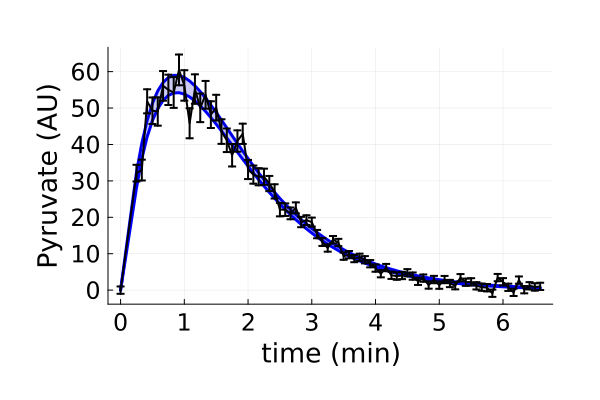

In [69]:
pr = plot(tsC2./60, PostQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PostQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PostQuant[1], fillrange=PostQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"][:,end]./60, dat["Means"][:,end,2], yerror = dat["Erros"][:,end,2], linewidth = 2, colour = "black", label = "")

# Generate Pseudodata 3

## Generate Repression Curve with Prior Means to Identify Good Sampling Points
Will do this for each posterior to assess better the sampling. At this iteration, we will choose a point in the high end of pyruvate concentrations, close to stady state but not the maximum allowed. 

In [70]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));

tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];

samps = convert.(Int, tsC2);

In [71]:
sampsTh = abs.(poster[:,1:13]);
sampsY0 = abs.(poster[:,14:end]);

In [72]:
Pyrs = collect(0:0.1:40);

Sims = Array{Any}(undef, length(Pyrs));

for i in 1:length(Pyrs)
    ivss = [Pyrs[i].*1000, 0, 0, mean(sampsY0, dims=1)[1], mean(sampsY0, dims=1)[2], mean(sampsY0, dims=1)[3], 0, 0, 0, 0, 0, Pyrs[i].*1000, 0, Pyrs[i].*1000*(trueP[end]*0.12)];
    
    SimulsAll1, SimulsAll2, SimulsAll3  = PyruvateHP_NMR_SolveAllCp(ts, hcat(mean(sampsTh, dims=1), 0), ivss, samps);
    Sims[i] = SimulsAll1;
end


In [73]:
# If we consider for the curve the maximum value on the lactate curve
Lacs = zeros(length(Pyrs));

for i in 1:length(Pyrs)
    Lacs[i] = maximum(Sims[i][:,13,1]);
end


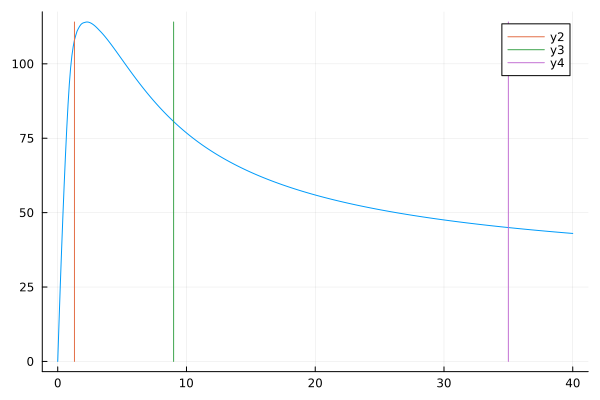

In [74]:
plot(Pyrs, Lacs, label = "")

plot!([1.3, 1.3],[0, maximum(Lacs)])
plot!([9, 9],[0, maximum(Lacs)])
plot!([35, 35],[0, maximum(Lacs)])

In [75]:
# If we consider for the curve the sum of all data points of the lactate curve

Lacs = zeros(length(Pyrs));

for i in 1:length(Pyrs)
    Lacs[i] = sum(Sims[i][:,13,1]);
end


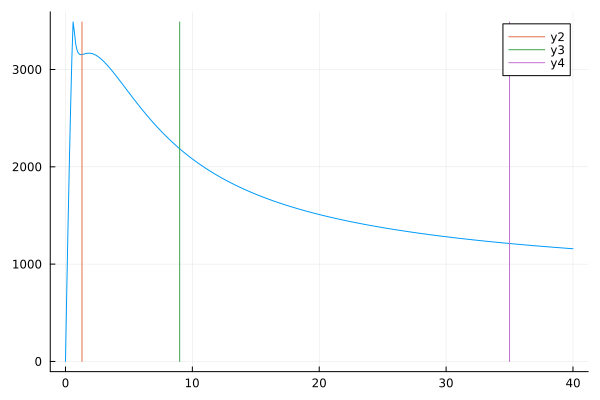

In [76]:
plot(Pyrs, Lacs, label = "")

plot!([1.3, 1.3],[0, maximum(Lacs)])
plot!([9, 9],[0, maximum(Lacs)])
plot!([35, 35],[0, maximum(Lacs)])

## Define Experimental Details

In [77]:
Nexp = 3;

PyrCons = [1.3, 9, 35].*1000

3-element Vector{Float64}:
  1300.0
  9000.0
 35000.0

## Compute Utility Function of Experiment

In [78]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));
global tsC2 = dat32mM[:,1]
global ts = 0:tsC2[end];
global samps = convert.(Int, tsC2);
global sampsTh = abs.(poster[:,1:13]);
global sampsY0 = abs.(poster[:,14:end]);

In [79]:
CompRepUtil_Entro_OEDmc(PyrCons[3]/1000)

97.6881891633754

In [80]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));

In [81]:
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];

ivssAll = Array{Any}(undef, Nexp);
for i in 1:Nexp
    ivssAll[i] = [PyrCons[i], 0, 0, InitsY0[1], InitsY0[2], InitsY0[3], 0, 0, 0, 0, 0, PyrCons[i], 0, PyrCons[i]*(trueP[end]*0.12)];;
end
samps = convert.(Int, tsC2);


## Simulate Experiments and Extract Observables

In [82]:
SimulsAll = Array{Any}(undef, Nexp,3);
for i in 1:Nexp
    SimulsAll[i,1], SimulsAll[i,2], SimulsAll[i,3]  = PyruvateHP_NMR_SolveAllCp(ts, vcat(trueP, 0), ivssAll[i], samps);
end

In [83]:
ObsS = Array{Any}(undef, Nexp,2);
for i in 1:Nexp
    ObsS[i,1] = SimulsAll[i,1][:,14,1]; # Pyruvate HP
    ObsS[i,2] = SimulsAll[i,1][:,13,1]; # Lactate HP
end


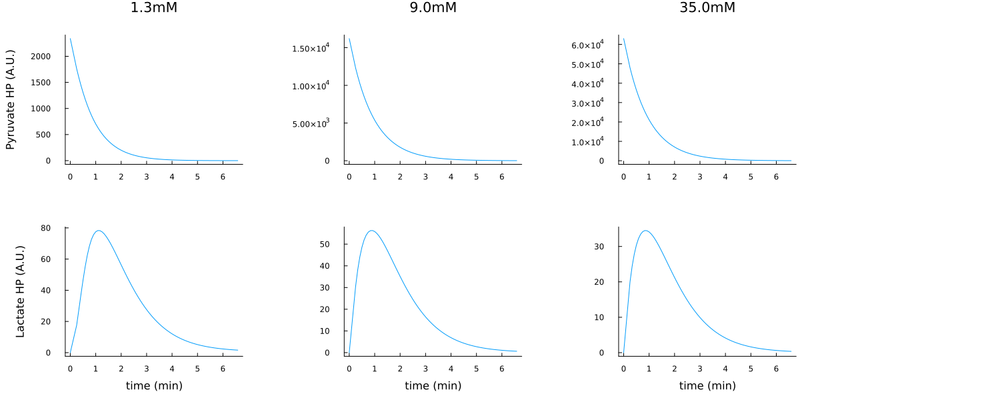

In [84]:
pp1 = plot(samps./60, ObsS[1,1], label = "", title = string(PyrCons[1]/1000)*"mM", ylabel = "Pyruvate HP (A.U.)")
pp2 = plot(samps./60, ObsS[1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")

PP1 = plot(pp1,pp2, layout = (2,1))

pp1 = plot(samps./60, ObsS[2,1], label = "", title = string(PyrCons[2]/1000)*"mM")
pp2 = plot(samps./60, ObsS[2,2], label = "", xlabel = "time (min)")

PP2 = plot(pp1,pp2, layout = (2,1))

pp1 = plot(samps./60, ObsS[3,1], label = "", title = string(PyrCons[3]/1000)*"mM")
pp2 = plot(samps./60, ObsS[3,2], label = "", xlabel = "time (min)")

PP3 = plot(pp1,pp2, layout = (2,1))

# pp1 = plot(samps./60, ObsS[4,1], label = "", title = string(PyrCons[4]/1000)*"mM")
# pp2 = plot(samps./60, ObsS[4,2], label = "", xlabel = "time (min)")

# PP4 = plot(pp1,pp2, layout = (2,1))

plot(PP1, PP2, PP3, layout = (1,4), grid = false, size = (1500,600), margin = 8mm)

## Simulate Noise

In [85]:
sigm1=0.12; # 10% additive heteroscedastic noise
sigm2=0.075;


Random.seed!(45659211); 

SolN1NoiseHet = zeros(length(samps),Nexp,2);
basemat = zeros(length(samps),Nexp,2);

i = 1

for i in 1:Nexp
    basemat[:,i,1] = ObsS[i,1]'.*sigm1; # introduce new diagonal matrices
    basemat[:,i,2] = ObsS[i,2]'.*sigm2;

    for zer in collect(1:length(samps)) # To avoid having standard deviations of 0
        if basemat[zer,i,1]<=1
            basemat[zer,i,1] = 1;
        end
        if basemat[zer,i,2]<=1
            basemat[zer,i,2] = 1;
        end
    end

    SolN1NoiseHet[:,i, 1] = ObsS[i,1]#+rand(MvNormal(zeros(length(samps)),basemat[:,i,1]));
    SolN1NoiseHet[:,i, 2] = ObsS[i,2]+rand(MvNormal(zeros(length(samps)),basemat[:,i,2]));
    SolN1NoiseHet[1,i, 2] = 0;
end

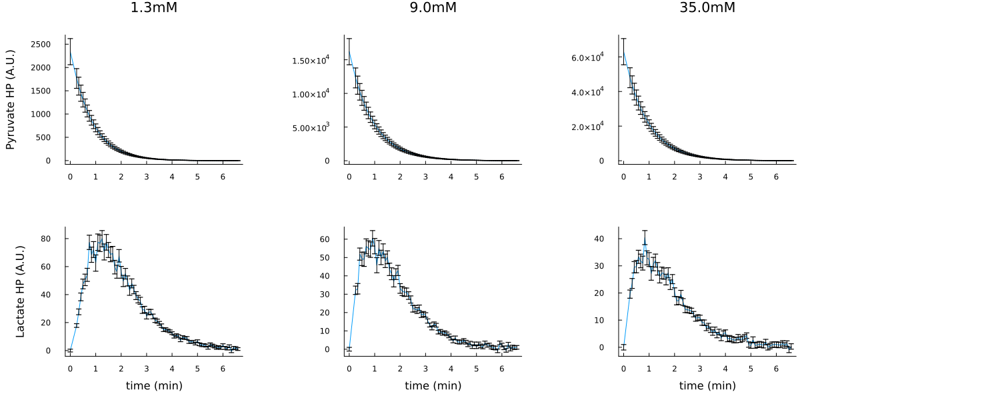

In [86]:
pp1 = plot(samps./60, SolN1NoiseHet[:,1, 1], yerror = basemat[:,1,1], label = "", title = string(PyrCons[1]/1000)*"mM", ylabel = "Pyruvate HP (A.U.)")
pp2 = plot(samps./60, SolN1NoiseHet[:,1, 2], yerror = basemat[:,1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")

PP1 = plot(pp1,pp2, layout = (2,1))

pp1 = plot(samps./60, SolN1NoiseHet[:,2, 1], yerror = basemat[:,2,1], label = "", title = string(PyrCons[2]/1000)*"mM")
pp2 = plot(samps./60, SolN1NoiseHet[:,2, 2], yerror = basemat[:,2,2], label = "", xlabel = "time (min)")

PP2 = plot(pp1,pp2, layout = (2,1))

pp1 = plot(samps./60, SolN1NoiseHet[:,3, 1], yerror = basemat[:,3,1], label = "", title = string(PyrCons[3]/1000)*"mM")
pp2 = plot(samps./60, SolN1NoiseHet[:,3, 2], yerror = basemat[:,3,2], label = "", xlabel = "time (min)")

PP3 = plot(pp1,pp2, layout = (2,1))

# pp1 = plot(samps./60, SolN1NoiseHet[:,4, 1], yerror = basemat[:,4,1], label = "", title = string(PyrCons[4]/1000)*"mM")
# pp2 = plot(samps./60, SolN1NoiseHet[:,4, 2], yerror = basemat[:,4,2], label = "", xlabel = "time (min)")

# PP4 = plot(pp1,pp2, layout = (2,1))

plot(PP1, PP2, PP3, layout = (1,4), grid = false, size = (1500,600), margin = 8mm)

## Generate CSV Files For PseudoData

In [74]:
# Observables
for i in 3:Nexp
    Observables = zeros(length(samps),5);
    Observables[:,1] = samps;
    Observables[:,2] = SolN1NoiseHet[:,i, 1];
    Observables[:,3] = basemat[:,i, 1];
    Observables[:,4] = SolN1NoiseHet[:,i, 2];
    Observables[:,5] = basemat[:,i, 2];
    obs_head = ["time","Pyr_MEAN","Pyr_STD","Lac_MEAN","Lac_STD"];

    df1 = DataFrame(Observables, :auto);
    rename!(df1, [obs_head[i] for i in 1:5]);
    CSV.write(string("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\CompRepr_ID",i,"_Observables_Pyr",string(string(PyrCons[i]/1000)),"mM.csv"), df1);
end

# Bayesian Inference 3

## Extract Data

In [87]:
mainpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\";
i = 3;
paths = [mainpath*"CompRepr_ID"*string(1)*"_Observables_Pyr"*(string(PyrCons[1]/1000))*"mM.csv",
         mainpath*"CompRepr_ID"*string(2)*"_Observables_Pyr"*(string(PyrCons[2]/1000))*"mM.csv",
         mainpath*"CompRepr_ID"*string(3)*"_Observables_Pyr"*(string(PyrCons[3]/1000))*"mM.csv"]

3-element Vector{String}:
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 73 bytes ⋯ "pr_ID1_Observables_Pyr1.3mM.csv"
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 73 bytes ⋯ "pr_ID2_Observables_Pyr9.0mM.csv"
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 74 bytes ⋯ "r_ID3_Observables_Pyr35.0mM.csv"

In [88]:
Random.seed!(231549);
global dat = restructDatInfCompRep_FixedSF(paths, rand(Uniform(boundY0[1][1],boundY0[2][1])), rand(Uniform(boundY0[1][2],boundY0[2][2])), rand(Uniform(boundY0[1][3],boundY0[2][3])), 15)

Dict{String, Any} with 14 entries:
  "Means"  => [2340.0 16200.0 63000.0; 1763.7 12302.0 47941.5; … ; -0.445567 12…
  "stsl"   => [78 78 78]
  "obSta"  => [1 2]
  "sts"    => [0 0 0; 15 15 15; … ; 390 390 390; 395 395 395]
  "obser"  => 2
  "Y0us"   => [1300.0 9000.0 35000.0; 0.0 0.0 0.0; … ; 0.0 0.0 0.0; 2340.0 1620…
  "ts"     => [1.0e-20 1.0e-20 1.0e-20; 1.0 1.0 1.0; … ; 394.0 394.0 394.0; 395…
  "itp"    => [0.0, 0.0, 0.0]
  "ncells" => [0 0 0]
  "stslm"  => 78
  "tml"    => 396
  "Erros"  => [280.8 1944.0 7560.0; 211.644 1476.24 5752.98; … ; 1.0 1.49104 6.…
  "m"      => 3
  "nts"    => [395 395 395]

## Prior Prediction

In [89]:
simsPrior = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"][:,end];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,end,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(poster[i,1:13], 0), ivss, samps);

    simsPrior[i] = SimulsAll;
end

In [90]:
# Dims = Up/Down, Observable, Experiment
PriorQuant = Array{Any}(undef,2,1,1);
lacPirorSims = zeros(size(simsPrior[1])[1], 8000)
[lacPirorSims[:,i] = simsPrior[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PriorQuant[1,k,m] = [percentile(lacPirorSims[j,:], 99.5) for j in 1:size(lacPirorSims)[1]]; # Up
        PriorQuant[2,k,m] = [percentile(lacPirorSims[j,:], 0.5 ) for j in 1:size(lacPirorSims)[1]]; # Down
    end
end


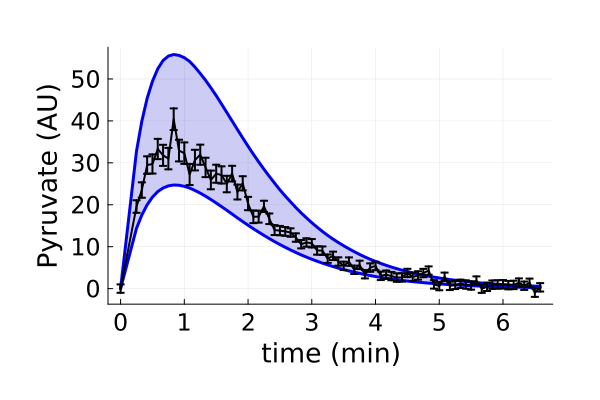

In [91]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"][:,end]./60, dat["Means"][:,end,2], yerror = dat["Erros"][:,end,2], linewidth = 2, colour = "black", label = "")

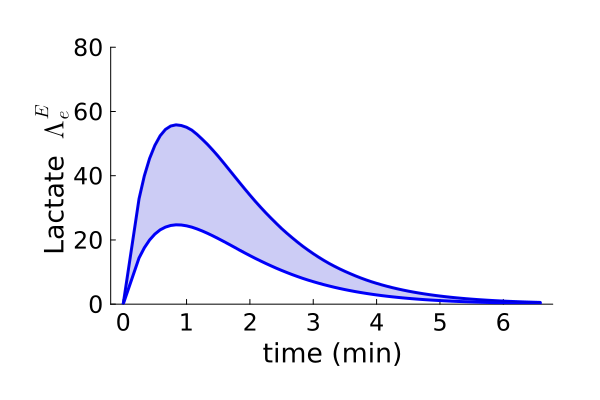

In [93]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Lactate  "*L"\Lambda^E_e", grid = false, ylim = (0,80))
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

savefig("IDPredIter3.svg")

pr

## MLE to obtain a good first guess for inference

In [80]:
global ScFm = 15;
p = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.01, 0.0003, 0.0001, 0.0002, 1e-1, 1e-6, 15, 50/(15*0.12), 5000/(15*0.12), 700/(15*0.12)];
ObjectFunctMECp_Multi_MLE(p)

6598.503958474518

In [81]:
Iters = 1;
CCsT = Array{Any}(undef,Iters);
FitsT = Array{Any}(undef,Iters);

In [82]:
i=1
fitness_progress_history = Array{Tuple{Int, Float64},1}()
callback = oc -> push!(fitness_progress_history, (num_func_evals(oc), best_fitness(oc)))

resM = bboptimize(ObjectFunctMECp_Multi_MLE; SearchRange = vcat([(minimum(abs.(poster[:,i])), maximum(abs.(poster[:,i]))) for i in 1:13], 
                                        [(minimum(abs.(poster[:,i])), maximum(abs.(poster[:,i]))) for i in 14:16]), # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
        MaxTime = 60*3, method = :adaptive_de_rand_1_bin, 
        CallbackFunction = callback, CallbackInterval = 0.0)

CCsT[i] = fitness_progress_history;
FitsT[i] = resM;

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
0.58 secs, 35 evals, 19 steps, improv/step: 0.526 (last = 0.5263), fitness=4207.335721514
1.14 secs, 79 evals, 43 steps, improv/step: 0.442 (last = 0.3750), fitness=919.764951438
1.70 secs, 124 evals, 71 steps, improv/step: 0.437 (last = 0.4286), fitness=919.764951438
2.21 secs, 171 evals, 104 steps, improv/step: 0.423 (last = 0.3939), fitness=919.764951438
2.71 secs, 220 evals, 144 steps, improv/step: 0.403 (last = 0.3500), fitness=919.764951438
3.22 secs, 270 evals, 187 steps, improv/step: 0.390 (last = 0.3488), fitness=919.764951438
3.73 secs, 321 evals, 229 steps, improv/step: 0.384 (last = 0.3571), fitness=620.137846028
4.23 secs, 371 evals, 272 steps, improv/step: 0.368 (last = 0.2791), fitness=620.137846028
4.77 secs, 418 evals, 317 steps, improv/step: 0.344 (last = 0.2000), fit

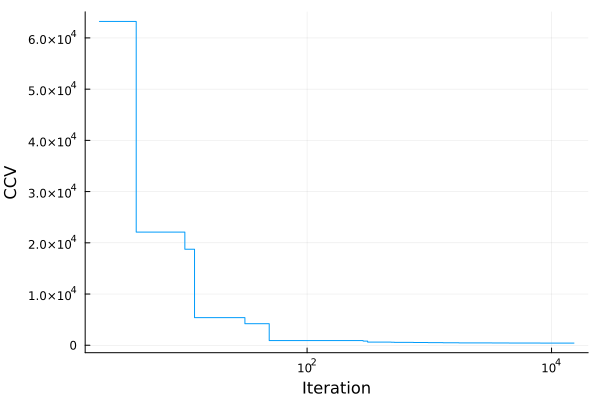

In [83]:
# Plot convergence curve
pl=plot(CCsT[1], xaxis=:log, linetype=:step, label = "", xlabel = "Iteration", ylabel = "CCV")
display(pl)

In [84]:
parfitT = zeros(16, Iters);
for i in 1:Iters
    parfitT[:,i] = best_candidate(FitsT[i]);
end
bestPind = findfirst([CCsT[i][end][2] for i in 1:length(CCsT)] .== minimum([CCsT[i][end][2] for i in 1:length(CCsT)]))
ppT = parfitT[:,bestPind]

16-element Vector{Float64}:
    48.0
    55.0
     0.004784814228707644
     0.018397962472299134
     0.054535938201759664
     0.8811183470864563
     1.2942470528280785
     0.5713493154438993
     2.248882065643761
     0.011579110865071102
     1.818169228685988
     0.0008852939382482484
    15.0
  1077.0526043800849
 24076.325764601403
   128.72676672919073

In [85]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMTRRCmp_ScF_ID3.jld2", "FitsT",FitsT)
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_ID3.jld2", 
        "resMMat",parfitT, "CCsT", CCsT)

In [23]:
ppT = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_ID3.jld2")["resMMat"][:,1]


16-element Vector{Float64}:
    48.0
    55.0
     0.004784814228707644
     0.018397962472299134
     0.054535938201759664
     0.8811183470864563
     1.2942470528280785
     0.5713493154438993
     2.248882065643761
     0.011579110865071102
     1.818169228685988
     0.0008852939382482484
    15.0
  1077.0526043800849
 24076.325764601403
   128.72676672919073

## Compute structure for Stan's initial guess

In [90]:
preTrans = zeros(13);

preTrans[1] = (ppT[3]-0.0055)/0.00275; 
preTrans[2] = (ppT[4]-0.0275)/0.01375;          
preTrans[3] = (ppT[5]-0.045)/0.0225;
preTrans[4] = (ppT[6]-0.45)/0.225;
preTrans[5] = (ppT[7]-0.95)/0.475;
preTrans[6] = (ppT[8]-0.95)/0.475;
preTrans[7] = (ppT[9]-0.95)/0.475;
preTrans[8] = (ppT[10]-0.0085)/0.00425;
preTrans[9] = (ppT[11]-0.95)/0.475;
preTrans[10] = (ppT[12]-0.0029)/0.00145;


preTrans[11] = (ppT[14]-650)/260;
preTrans[12] = (ppT[15]-16000)/6400;
preTrans[13] = (ppT[16]-550)/275;

In [91]:
function genStanInitDict(samps, names, chains)
    alltog = Array{Dict{String,Any},1}(undef,chains);
    for i in 1:(chains)
        global tmp = Dict{String, Any}()
        for j in 1:length(names)
            tmp[names[j]] = samps[j,i];
        end
        alltog[i] = tmp
    end

    return(alltog)
end

samps = hcat(preTrans,preTrans,preTrans,preTrans);
names = ["kin","kpl","kbn","kun","kbp","kup","kunE","kbnE","ki","kr","NADH","NAD","LDH"];

ini = genStanInitDict(samps, names, 4)

4-element Vector{Dict{String, Any}}:
 Dict("kbnE" => 0.7244966741343767, "LDH" => -1.5319026664393065, "kin" => -0.26006755319722025, "ki" => 1.8277246919705015, "kunE" => 2.734488559250024, "kpl" => -0.6619663656509721, "NADH" => 1.6425100168464801, "kup" => -0.7971593359075803, "kbp" => 0.724730637532797, "kr" => -1.3894524563805184…)
 Dict("kbnE" => 0.7244966741343767, "LDH" => -1.5319026664393065, "kin" => -0.26006755319722025, "ki" => 1.8277246919705015, "kunE" => 2.734488559250024, "kpl" => -0.6619663656509721, "NADH" => 1.6425100168464801, "kup" => -0.7971593359075803, "kbp" => 0.724730637532797, "kr" => -1.3894524563805184…)
 Dict("kbnE" => 0.7244966741343767, "LDH" => -1.5319026664393065, "kin" => -0.26006755319722025, "ki" => 1.8277246919705015, "kunE" => 2.734488559250024, "kpl" => -0.6619663656509721, "NADH" => 1.6425100168464801, "kup" => -0.7971593359075803, "kbp" => 0.724730637532797, "kr" => -1.3894524563805184…)
 Dict("kbnE" => 0.7244966741343767, "LDH" => -1.531902666

In [92]:
ini[1]

Dict{String, Any} with 13 entries:
  "kbnE" => 0.724497
  "LDH"  => -1.5319
  "kin"  => -0.260068
  "ki"   => 1.82772
  "kunE" => 2.73449
  "kpl"  => -0.661966
  "NADH" => 1.64251
  "kup"  => -0.797159
  "kbp"  => 0.724731
  "kr"   => -1.38945
  "NAD"  => 1.26193
  "kun"  => 1.91608
  "kbn"  => 0.423819

## Inference

In [95]:
modelpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\HP_PyrLac_CompetitiveRepressionModel_FixedT1ScF.stan";
stream = open(modelpath,"r");
Model = read(stream,String);
close(stream);

StanModel = Stanmodel(name="PyrCompRepr_ID3_Try1", model=Model, nchains =4,
            num_samples  = 2000, num_warmup = 1000, printsummary=true);
StanModel.method.save_warmup = true;
StanModel.method.adapt.delta = 0.85;
StanModel.method.algorithm.stepsize = 0.1;
StanModel.method.algorithm.engine.max_depth=10;
StanModel.method.algorithm.stepsize_jitter = 0.5;

In [96]:
rc, chns, cnames = stan(StanModel, dat, init = ini) 


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -4: 
Convergence test failures occurred too many times during one internal time step or minimum step size was reached. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessingInference/ComputationalBayesianOED/tmp/PyrCompRepr_ID3_Try1.stan', line 198, column 6 to column 133)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -1: 
The solver took mxstep internal steps but could not reach tout. (in 'c:

Inference for Stan model: PyrCompRepr_ID3_Try1_model
4 chains: each with iter=(2000,2000,2000,2000); warmup=(1000,1000,1000,1000); thin=(1,1,1,1); 12000 iterations saved.

Warmup took (345325, 342291, 336584, 353341) seconds, 383 hours total
Sampling took (633696, 639622, 704771, 650159) seconds, 730 hours total

                    Mean     MCSE   StdDev        5%       50%       95%    N_Eff  N_Eff/s    R_hat

lp__            -4.3e+02  4.9e-02  2.5e+00  -4.4e+02  -4.3e+02  -4.3e+02  2.6e+03  9.9e-04  1.0e+00
accept_stat__    9.1e-01  1.1e-02  1.7e-01   5.5e-01   9.7e-01   1.0e+00      244  9.3e-05      1.0
stepsize__       6.0e-03  3.8e-04  1.8e-03   3.2e-03   5.9e-03   8.9e-03       23  8.7e-06      1.0
treedepth__      9.1e+00  6.0e-02  1.1e+00   8.0e+00   9.0e+00   1.0e+01      364  1.4e-04      1.0
n_leapfrog__     7.3e+02  2.2e+01  3.0e+02   2.6e+02   5.1e+02   1.0e+03      176  6.7e-05      1.0
divergent__      2.8e-02  2.3e-03  1.6e-01   0.0e+00   0.0e+00   0.0e+00     5031  1

(0, [-432.102 0.658583 … 18323.7 142.075; -432.102 0.0 … 18323.7 142.075; … ; -440.051 0.954991 … 18653.3 157.483; -435.789 0.981651 … 14845.5 133.802;;; -432.465 0.989755 … 9840.86 230.151; -432.465 0.0 … 9840.86 230.151; … ; -441.402 0.216342 … 9990.64 615.073; -436.677 0.994901 … 6142.93 465.187;;; -442.014 0.994522 … 25359.9 127.161; -442.014 0.0 … 25359.9 127.161; … ; -432.264 0.981347 … 15413.8 418.195; -434.601 0.875104 … 15420.9 232.178;;; -440.453 0.891118 … 27111.5 257.934; -440.453 0.0 … 27111.5 257.934; … ; -438.526 0.957012 … 23689.6 454.689; -435.947 0.986661 … 4437.77 246.338], ["lp__", "accept_stat__", "stepsize__", "treedepth__", "n_leapfrog__", "divergent__", "energy__", "kin", "kpl", "kbn"  …  "theta.7", "theta.8", "theta.9", "theta.10", "theta.11", "theta.12", "theta.13", "inits.1", "inits.2", "inits.3"])

In [97]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PyrCompetitiveRepressionInferRes_ID3_Try1.jld", "rc", rc, "chns", chns, "cnames", cnames)

In [98]:
poster = vcat(chns[1001:end, end-15:end, 1], chns[1001:end, end-15:end, 2], chns[1001:end, end-15:end, 3], chns[1001:end, end-15:end, 4])
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_ID3_Try1.jld", "poster", poster)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_ID3_Try1.csv", DataFrame(poster, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_ID3_Try1.csv"

In [39]:
poster = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_ID3_Try1.csv", DataFrame))

8000×16 Matrix{Float64}:
 48.0  55.0  0.00452166  0.0186251  …  15.0  1022.23   18998.0   123.955
 48.0  55.0  0.00513441  0.018263      15.0   458.805  14683.7   147.888
 48.0  55.0  0.00498515  0.0178563     15.0   468.766   4957.38  131.656
 48.0  55.0  0.00436716  0.0182264     15.0   651.876  15562.3   120.698
 48.0  55.0  0.00490222  0.0181433     15.0   835.642  22017.3   118.452
 48.0  55.0  0.00530362  0.0179928  …  15.0   387.924  18687.4   193.502
 48.0  55.0  0.00681168  0.0184294     15.0   685.236   9848.4   329.707
 48.0  55.0  0.00833938  0.0184524     15.0   172.805  13278.3   562.053
 48.0  55.0  0.00563341  0.0186872     15.0   227.186  17895.4   276.682
 48.0  55.0  0.00709873  0.0183995     15.0   201.866  24907.5   418.931
  ⋮                                 ⋱                              ⋮
 48.0  55.0  0.0065645   0.0187166     15.0   412.913  17438.3   300.578
 48.0  55.0  0.00608499  0.0182718     15.0   215.122  10378.5   278.37
 48.0  55.0  0.00698999  0.0188

In [25]:
namess = ["kin","kpl","kbn","kun","kbp","kup","kunE","kbnE","ki","kr","NADH","NAD","LDH"];

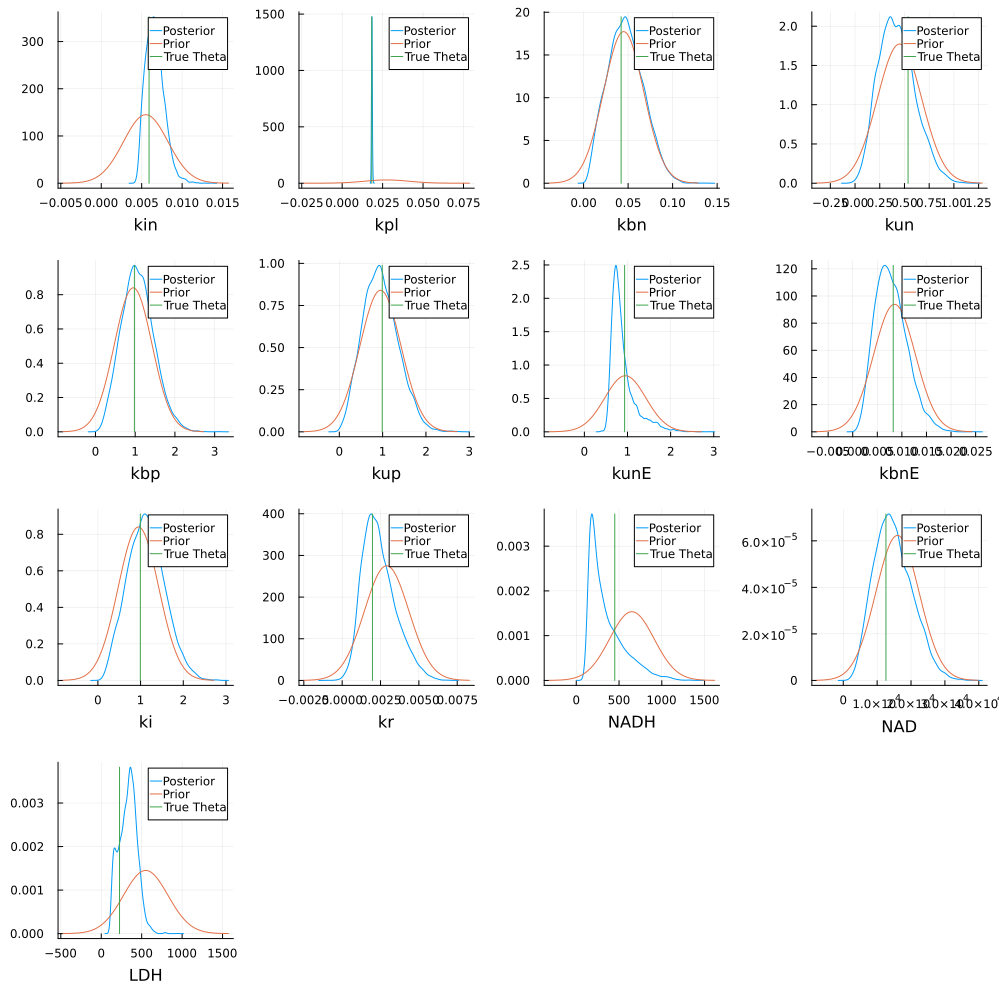

In [30]:
pp1 = plot(kde(poster[:,3]), label = "Posterior", xlabel = namess[1])
plot!(Normal(0.0055, 0.00275), label = "Prior")
plot!([trueP[3], trueP[3]],[0, maximum(kde(poster[:,3]).density)], label = "True Theta")

pp2 = plot(kde(poster[:,4]), label = "Posterior", xlabel = namess[2])
plot!(Normal(0.0275, 0.01375), label = "Prior")
plot!([trueP[4], trueP[4]],[0, maximum(kde(poster[:,4]).density)], label = "True Theta")

pp3 = plot(kde(poster[:,5]), label = "Posterior", xlabel = namess[3])
plot!(Normal(0.045, 0.0225), label = "Prior")
plot!([trueP[5], trueP[5]],[0, maximum(kde(poster[:,5]).density)], label = "True Theta")

pp4 = plot(kde(poster[:,6]), label = "Posterior", xlabel = namess[4])
plot!(Normal(0.45, 0.225), label = "Prior")
plot!([trueP[6], trueP[6]],[0, maximum(kde(poster[:,6]).density)], label = "True Theta")

pp5 = plot(kde(poster[:,7]), label = "Posterior", xlabel = namess[5])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[7], trueP[7]],[0, maximum(kde(poster[:,7]).density)], label = "True Theta")

pp6 = plot(kde(poster[:,8]), label = "Posterior", xlabel = namess[6])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[8], trueP[8]],[0, maximum(kde(poster[:,8]).density)], label = "True Theta")

pp7 = plot(kde(poster[:,9]), label = "Posterior", xlabel = namess[7])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[9], trueP[9]],[0, maximum(kde(poster[:,9]).density)], label = "True Theta")

pp8 = plot(kde(poster[:,10]), label = "Posterior", xlabel = namess[8])
plot!(Normal(0.0085, 0.00425), label = "Prior")
plot!([trueP[10], trueP[10]],[0, maximum(kde(poster[:,10]).density)], label = "True Theta")

pp9 = plot(kde(poster[:,11]), label = "Posterior", xlabel = namess[9])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[11], trueP[11]],[0, maximum(kde(poster[:,11]).density)], label = "True Theta")

pp10 = plot(kde(poster[:,12]), label = "Posterior", xlabel = namess[10])
plot!(Normal(0.0029, 0.00145), label = "Prior")
plot!([trueP[12], trueP[12]],[0, maximum(kde(poster[:,12]).density)], label = "True Theta")


pp11 = plot(kde(poster[:,14]), label = "Posterior", xlabel = namess[11])
plot!(Normal(650, 260), label = "Prior")
plot!([InitsY0[1], InitsY0[1]],[0, maximum(kde(poster[:,14]).density)], label = "True Theta")

pp12 = plot(kde(poster[:,15]), label = "Posterior", xlabel = namess[12])
plot!(Normal(16000, 6400), label = "Prior")
plot!([InitsY0[2], InitsY0[2]],[0, maximum(kde(poster[:,15]).density)], label = "True Theta")

pp13 = plot(kde(poster[:,16]), label = "Posterior", xlabel = namess[13])
plot!(Normal(550, 275), label = "Prior")
plot!([InitsY0[3], InitsY0[3]],[0, maximum(kde(poster[:,16]).density)], label = "True Theta")

plot(pp1,pp2,pp3,pp4,pp5,pp6,pp7,pp8,pp9,pp10,pp11,pp12,pp13, size=(1000,1000))

In [31]:
-log(det(cov(hcat(poster[:,3:12], poster[:,14:end]))))

43.701076223893544

## Simulate Experiment Current Posterior

In [35]:
simsPoster = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"][:,end];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,end,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(poster[i,1:13], 0), ivss, samps);

    simsPoster[i] = SimulsAll;
end

In [36]:
# Dims = Up/Down, Observable, Experiment
PostQuant = Array{Any}(undef,2,1,1);
lacPostSims = zeros(size(simsPoster[1])[1], 8000)
[lacPostSims[:,i] = simsPoster[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PostQuant[1,k,m] = [percentile(lacPostSims[j,:], 99.5) for j in 1:size(lacPostSims)[1]]; # Up
        PostQuant[2,k,m] = [percentile(lacPostSims[j,:], 0.5 ) for j in 1:size(lacPostSims)[1]]; # Down
    end
end


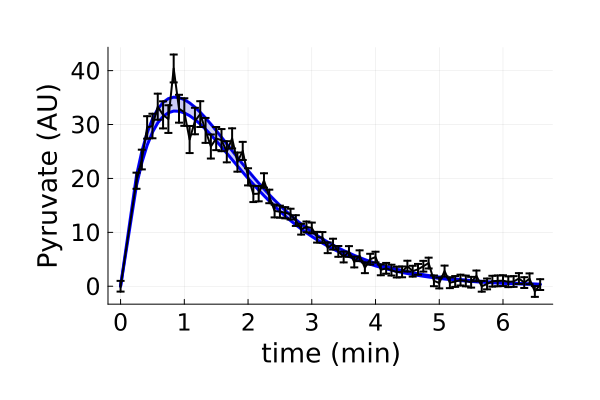

In [37]:
pr = plot(tsC2./60, PostQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PostQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PostQuant[1], fillrange=PostQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"][:,end]./60, dat["Means"][:,end,2], yerror = dat["Erros"][:,end,2], linewidth = 2, colour = "black", label = "")